## 2 - Export Data Assessment (Inter-parameter)

##### Imports

In [1]:
import os
import ast
import pandas as pd
import numpy as np
import scipy as su
# from typing import Dict
# from scipy.signal import
# from scikit-learn import

import matplotlib.pyplot as plt
import seaborn as sns

import dask.dataframe as dd

##### Data Loading

In [49]:
# Load ddfs into dictionary (exception for 'all_surf_pos', df)
root_dir = './aggregated_data'
def load_data(root_dir, exception=False):    # Get csv file reads into one dictionary
    data = {}
    for subdir, _, files in os.walk(root_dir):
        for file in files:
            file_path = os.path.join(subdir, file)
            file_name = os.path.splitext(file)[0]   #file name without '.csv'
            if file.endswith('.csv') and file != 'all_surf_positions_HiDrive_Studie2.csv':
                data[file_name] = dd.read_csv(file_path)    #read and attach to dict
            elif exception and file == 'all_surf_positions_HiDrive_Studie2.csv':
                data[file_name] = pd.read_csv(file_path, converters=converters)    #read as normal and attach to dict
    return data
def parse(filedata):
    for line in filedata.split('\n'): 
        line = line.strip()
        if not line:
            continue  # skip empty lines
        row = ast.literal_eval(line) # evaluate the str into obj
    return row
converters = {
    "img_to_surf_trans": parse,
    "surf_to_img_trans": parse,
    "dist_img_to_surf_trans": parse,
    "surf_to_dist_img_trans": parse,
}

data = load_data(root_dir)
participant_ids = [1,2,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20]

In [50]:
gui_ddf = data['all_gui_data']
gui_df = gui_ddf.compute()
gui_df['block_data'] = gui_df['block_data'].apply(lambda x: eval(x))

### 1. Ocular Correlations
(value only)
Gaze, Fixations, Blink, Pupil, Surface gaze

##### Gaze-fixations confidence
- Positive correlation
- Mean: 0.76
- Std : 0.07
- Common timestamps are enough

In [43]:
gaze_conf_df = data['all_gaze_positions'][['participant_id', 'gaze_timestamp', 'confidence']].compute()
fix_conf_df = data['all_fixations'][['participant_id', 'start_timestamp', 'confidence', 'duration', 'dispersion']].compute()
correlation_results = []

for pid in participant_ids:
    participant_gaze_df = gaze_conf_df[gaze_conf_df['participant_id'] == pid]
    participant_fix_df = fix_conf_df[fix_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_gaze_df,
        participant_fix_df,
        left_on=['gaze_timestamp', 'participant_id'],
        right_on=['start_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_gaze', '_fix')
    )
    merged_df.drop(columns=['start_timestamp'], inplace=True)
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_gaze'].corr(merged_df['confidence_fix'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.7637640725059477
Std: 0.0719012571802057
    participant_id  correlation
0                1     0.755600
1                2     0.801051
2                4     0.634339
3                5     0.749038
4                6     0.616272
5                7     0.871625
6                8     0.893638
7                9     0.775882
8               10     0.794738
9               11     0.652270
10              12     0.786944
11              13     0.761851
12              14     0.736556
13              15     0.798353
14              16     0.782439
15              17     0.762697
16              18     0.716798
17              19     0.837147
18              20     0.784280


##### Blink-pupil confidence
- No correlation
- Mean: 0.17
- Std : 0.09
- Common timestamps are enough

In [ ]:
blink_conf_df = data['all_blinks'][['participant_id', 'start_timestamp', 'confidence']].compute()
pupil_conf_df = data['all_pupil_positions'][['participant_id', 'pupil_timestamp', 'confidence', 'diameter_3d']].compute().dropna()

for pid in participant_ids:
    participant_blink_df = blink_conf_df[blink_conf_df['participant_id'] == pid]
    participant_pupil_df = pupil_conf_df[pupil_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_blink_df,
        participant_pupil_df,
        left_on=['start_timestamp', 'participant_id'],
        right_on=['pupil_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_blink', '_pupil')
    )
    merged_df.drop(columns=['pupil_timestamp'], inplace=True)
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_blink'].corr(merged_df['confidence_pupil'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.1732386879533013
Std: 0.09122183073950553
    participant_id  correlation
0                1     0.310914
1                2     0.012724
2                4     0.187609
3                5     0.148912
4                6     0.180748
5                7     0.238138
6                8     0.130538
7                9     0.075113
8               10     0.184982
9               11     0.012433
10              12     0.228563
11              13     0.255767
12              14     0.193961
13              15     0.229731
14              16     0.302944
15              17     0.009934
16              18     0.242173
17              19     0.152989
18              20     0.193359


##### Pupil-gaze confidence
- Almost same value
- Mean: 0.90
- Std : 0.03
- Common timestamps are enough

In [ ]:
correlation_results = []

for pid in participant_ids:
    participant_pupil_df = pupil_conf_df[pupil_conf_df['participant_id'] == pid]
    participant_gaze_df = gaze_conf_df[gaze_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_pupil_df,
        participant_gaze_df,
        left_on=['pupil_timestamp', 'participant_id'],
        right_on=['gaze_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_pupil', '_gaze')
    )
    merged_df.drop(columns=['gaze_timestamp'], inplace=True)
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_pupil'].corr(merged_df['confidence_gaze'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation, "n_pupils": participant_pupil_df.shape[0], "n_merged": merged_df.shape[0]})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

NameError: name 'pupil_conf_df' is not defined

In [ ]:
correlation_results = []

for pid in participant_ids:
    participant_pupil_df = pupil_conf_df[pupil_conf_df['participant_id'] == pid]
    participant_gaze_df = gaze_conf_df[gaze_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_pupil_df,
        participant_gaze_df,
        left_on=['pupil_timestamp', 'participant_id'],
        right_on=['gaze_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_pupil', '_gaze')
    )
    merged_df.drop(columns=['gaze_timestamp'], inplace=True)
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_pupil'].corr(merged_df['confidence_gaze'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation, "n_pupils": participant_pupil_df.shape[0], "n_merged": merged_df.shape[0]})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.9073891230082433
Std: 0.033349585161236275
    participant_id  correlation
0                1     0.939050
1                2     0.898718
2                4     0.885599
3                5     0.930444
4                6     0.958471
5                7     0.876761
6                8     0.826872
7                9     0.895905
8               10     0.892346
9               11     0.941373
10              12     0.907584
11              13     0.926768
12              14     0.906497
13              15     0.856472
14              16     0.906119
15              17     0.957751
16              18     0.927451
17              19     0.888171
18              20     0.918041


##### Gaze-surface gaze confidence
- Same value
- Mean: 1.00
- Std : 0.00
- Common timestamps are enough

In [ ]:
surf_gaze_conf_df = data['all_gaze_positions_on_surface_HiDrive_Studie2'][['participant_id', 'gaze_timestamp', 'world_timestamp', 'confidence']].compute()
correlation_results = []

for pid in participant_ids:
    participant_gaze_df = gaze_conf_df[gaze_conf_df['participant_id'] == pid]
    participant_surf_gaze_df = surf_gaze_conf_df[surf_gaze_conf_df['participant_id'] == pid]
    # display(f'PARTICIPANT {pid}')
    # display(f'n_gaze: {participant_gaze_df.shape[0]}')
    # display(f'n_surf_gaze: {participant_surf_gaze_df.shape[0]}')

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_gaze_df,
        participant_surf_gaze_df,
        on=['gaze_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_gaze', '_surf_gaze')
    )
    merged_df.drop(columns=['gaze_timestamp'], inplace=True)
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_gaze'].corr(merged_df['confidence_surf_gaze'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.9990907016047892
Std: 0.00037670601330045507
    participant_id  correlation
0                1     0.999487
1                2     0.998757
2                4     0.999577
3                5     0.999177
4                6     0.998671
5                7          NaN
6                8     0.999222
7                9          NaN
8               10     0.998917
9               11     0.999458
10              12     0.998618
11              13     0.998547
12              14          NaN
13              15          NaN
14              16     0.999572
15              17     0.999183
16              18     0.998868
17              19     0.999541
18              20     0.998766


##### Surface gaze-fixations confidence
- Almost same value
- Mean: 0.76
- Std : 0.72
- Common timestamps are enough

In [ ]:
# Load data
surf_gaze_conf_df = data['all_gaze_positions_on_surface_HiDrive_Studie2'].iloc[:, 1:].compute()
fix_conf_df = data['all_fixations'][['participant_id', 'start_timestamp', 'confidence', 'duration', 'dispersion']].compute()

In [ ]:
correlation_results = []

for pid in participant_ids:
    participant_surf_gaze_df = surf_gaze_conf_df[surf_gaze_conf_df['participant_id'] == pid]
    participant_fix_df = fix_conf_df[fix_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_surf_gaze_df,
        participant_fix_df,
        left_on=['gaze_timestamp', 'participant_id'],
        right_on=['start_timestamp', 'participant_id'],
        how='inner',
        suffixes=('_gaze', '_fix')
    )
    merged_df.drop(columns=['start_timestamp'], inplace=True)
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

    correlation = merged_df['confidence_gaze'].corr(merged_df['confidence_fix'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.7631202584279899
Std: 0.07217661610645532
    participant_id  correlation
0                1     0.754508
1                2     0.801686
2                4     0.633957
3                5     0.745324
4                6     0.615005
5                7     0.871293
6                8     0.893726
7                9     0.775246
8               10     0.794813
9               11     0.652833
10              12     0.786832
11              13     0.755498
12              14     0.736933
13              15     0.798180
14              16     0.782435
15              17     0.762717
16              18     0.715879
17              19     0.837963
18              20     0.784457


##### Surface gaze-surface markers confidence
- No correlation -> independent
- Mean: 0.03
- Std : 0.03
- Common timestamps are enough

In [ ]:
surf_pos_conf_df = data['all_surf_positions_HiDrive_Studie2'][['participant_id', 'world_timestamp', 'num_detected_markers']]
correlation_results = []

for pid in participant_ids:
    participant_surf_gaze_df = surf_gaze_conf_df[surf_gaze_conf_df['participant_id'] == pid]
    participant_surf_pos_df = surf_pos_conf_df[surf_pos_conf_df['participant_id'] == pid]

    # Merge based on shared timestamps
    merged_df = pd.merge(
        participant_surf_gaze_df,
        participant_surf_pos_df,
        left_on=['world_timestamp', 'participant_id'],
        right_on=['world_timestamp', 'participant_id'],
        how='inner',
    )
    merged_df.drop(columns=['world_timestamp'], inplace=True)

    correlation = merged_df['confidence'].corr(merged_df['num_detected_markers'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})
    # display(f"PARTICIPANT {pid}")
    # display(f'n_merged: {merged_df.shape[0]}')

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation'].mean()}")
print(f"Std: {correlation_df['correlation'].std()}")
print(correlation_df)

Mean: 0.03778449383349313
Std: 0.0317467954225391
    participant_id  correlation
0                1     0.032102
1                2    -0.011726
2                4     0.003504
3                5     0.003963
4                6     0.057586
5                7          NaN
6                8     0.052319
7                9          NaN
8               10     0.049948
9               11     0.043753
10              12     0.052182
11              13     0.073819
12              14          NaN
13              15          NaN
14              16    -0.021155
15              17     0.025664
16              18     0.088347
17              19     0.059047
18              20     0.057415


##### Pupil diameter-surface fixation duration
- No correlation
- Mean: 0.01
- Std : 0.03
- Check next 200 ms(?)
- Check event-related(?)

In [ ]:
pupil_conf_df = data['all_pupil_positions'][['participant_id', 'pupil_timestamp', 'confidence', 'diameter_3d']].compute().dropna()

In [ ]:
# Load surf_fix handling repeated rows
surf_fix_conf_df = data['all_fixations_on_surface_HiDrive_Studie2'].compute()
surf_fix_conf_df = surf_fix_conf_df.groupby(['participant_id', 'fixation_id']).agg({
    'start_timestamp': 'first',
    'duration': 'first',
    'dispersion': 'first',
    'norm_pos_x': 'first',
    'norm_pos_y': 'first',
    'x_scaled': 'first',
    'y_scaled': 'first',
    'on_surf': 'first',
    'world_index': lambda x: list(x)  # Aggregate world_index into a list
}).reset_index()

# Rename the aggregated world_index column to world_indexes
surf_fix_conf_df = surf_fix_conf_df.rename(columns={'world_index': 'world_indexes'})
surf_fix_conf_ddf = dd.from_pandas(surf_fix_conf_df, npartitions=2)

In [ ]:
def get_diameter3d(pp_df, sfix_df):
    mean_diameters = []
    std_diameters = []
    for idx, fixation in sfix_df.iterrows():
        start_time = fixation['start_timestamp'] -.003
        end_time = start_time + (fixation['duration']/1000) + .003   # from [ms] to [s]

        # Filter pupil data within the fixation period
        relevant_pupil_data = pp_df[(pp_df['pupil_timestamp'] >= start_time) & (pp_df['pupil_timestamp'] <= end_time)]

        mean_diameter = relevant_pupil_data['diameter_3d'].mean()
        std_diameter = relevant_pupil_data['diameter_3d'].std()
        mean_diameters.append(mean_diameter)
        std_diameters.append(std_diameter)
    return [mean_diameters, std_diameters]

In [ ]:
correlation_results = []

for pid in participant_ids:
    participant_pupil_df = pupil_conf_df[pupil_conf_df['participant_id'] == pid]
    participant_surf_fix_df = surf_fix_conf_df[surf_fix_conf_df['participant_id'] == pid].copy() # copy to handle unexpected behaviors

    # Extract diameter3d details
    diameter3d_details = get_diameter3d(participant_pupil_df, participant_surf_fix_df)
    participant_surf_fix_df.loc[:, 'mean_diameter_3d'] = diameter3d_details[0]
    participant_surf_fix_df.loc[:, 'std_diameter_3d'] = diameter3d_details[1]

    # Drop NaN values before calculating correlation
    participant_surf_fix_df = participant_surf_fix_df.dropna(subset=['mean_diameter_3d', 'duration'])

    correlation_mean = participant_surf_fix_df['mean_diameter_3d'].corr(participant_surf_fix_df['duration'])
    correlation_std = participant_surf_fix_df['std_diameter_3d'].corr(participant_surf_fix_df['duration'])
    correlation_results.append({'participant_id': pid, 'correlation_mean': correlation_mean, 'correlation_std': correlation_std})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation_mean'].mean()}")
print(f"Std: {correlation_df['correlation_std'].std()}")
print(correlation_df)

Mean: 0.008836423508145383
Std: 0.03677248411676081
    participant_id  correlation_mean  correlation_std
0                1          0.017634        -0.030365
1                2         -0.008939        -0.015239
2                4         -0.011508        -0.104658
3                5         -0.091881         0.010282
4                6         -0.036356        -0.035053
5                7          0.036597        -0.047512
6                8          0.092872        -0.087125
7                9          0.009233         0.028194
8               10         -0.024238        -0.034338
9               11          0.030182        -0.004089
10              12          0.040282        -0.020678
11              13         -0.038538         0.001858
12              14         -0.003758         0.012666
13              15          0.131551         0.019534
14              16          0.002332        -0.046495
15              17         -0.012708        -0.034344
16              18         -0.

##### Pupil diameter-surface fixation dispersion
- No correlation
- Mean: -0.05
- Std : 0.04
- Check next 200 ms(?)
- Check event-related(?)

In [ ]:
correlation_results = []

for pid in participant_ids:
    participant_pupil_df = pupil_conf_df[pupil_conf_df['participant_id'] == pid]
    participant_surf_fix_df = surf_fix_conf_df[surf_fix_conf_df['participant_id'] == pid].copy() # copy to handle unexpected behaviors

    # Extract diameter3d details
    diameter3d_details = get_diameter3d(participant_pupil_df, participant_surf_fix_df)
    participant_surf_fix_df.loc[:, 'mean_diameter_3d'] = diameter3d_details[0]
    participant_surf_fix_df.loc[:, 'std_diameter_3d'] = diameter3d_details[1]

    # Drop NaN values before calculating correlation
    participant_surf_fix_df = participant_surf_fix_df.dropna(subset=['mean_diameter_3d', 'duration'])

    correlation_mean = participant_surf_fix_df['mean_diameter_3d'].corr(participant_surf_fix_df['dispersion'])
    correlation_std = participant_surf_fix_df['std_diameter_3d'].corr(participant_surf_fix_df['dispersion'])
    correlation_results.append({'participant_id': pid, 'correlation_mean': correlation_mean, 'correlation_std': correlation_std})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean: {correlation_df['correlation_mean'].mean()}")
print(f"Std: {correlation_df['correlation_std'].std()}")
print(correlation_df)

Mean: -0.04972326178549232
Std: 0.041319106265606115
    participant_id  correlation_mean  correlation_std
0                1         -0.081434         0.031628
1                2         -0.016608        -0.010059
2                4         -0.012943         0.049217
3                5          0.026230        -0.013572
4                6         -0.016217         0.028455
5                7         -0.121324        -0.054795
6                8         -0.018827         0.020838
7                9         -0.105366        -0.064542
8               10         -0.016637        -0.000251
9               11         -0.038671         0.004713
10              12         -0.061060        -0.006615
11              13         -0.009690        -0.028801
12              14         -0.053251        -0.014013
13              15         -0.204222        -0.113774
14              16         -0.020305         0.037081
15              17         -0.026555         0.000329
16              18         -0

### 2. GUI-Ocular Correlations
(value only) Difficulty, Frequency, Reaction time, Completion time, Errors, Diameter, Dispersion, Duration

In [ ]:
# Define variables
# Difficulty
easy_block = [1, 2, 5, 6]
hard_block = [3, 4, 7, 8]

# Frequency
slow_block = [1, 3, 5, 7]
fast_block = [2, 4, 6, 8]

# Difficulty+Frequency
easy_slow_block = [1, 5]
easy_fast_block = [2, 6]
hard_slow_block = [3, 7]
hard_fast_block = [4, 8]

In [ ]:
# Create gui dfs
gui_df_easy = gui_df[gui_df['block_type'].isin(easy_block)]
gui_df_hard = gui_df[gui_df['block_type'].isin(hard_block)]

gui_df_slow = gui_df[gui_df['block_type'].isin(slow_block)]
gui_df_fast = gui_df[gui_df['block_type'].isin(fast_block)]

gui_df_easy_slow = gui_df[gui_df['block_type'].isin(easy_slow_block)]
gui_df_hard_slow = gui_df[gui_df['block_type'].isin(hard_slow_block)]
gui_df_easy_fast = gui_df[gui_df['block_type'].isin(easy_fast_block)]
gui_df_hard_fast = gui_df[gui_df['block_type'].isin(hard_fast_block)]

##### Difficulty - Pupil diameter
- No correlation

In [ ]:
# Diameter data based on difficulty
unix_intervals_easy = gui_df_easy['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard = gui_df_hard['block_data'].apply(tuple).unique().tolist()

diameter_ddf = data['all_pupil_positions'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
interval_mask_easy = pd.Series(False, index=diameter_df.index)
interval_mask_hard = pd.Series(False, index=diameter_df.index)

for start, _, end in unix_intervals_easy:
    interval_mask_easy |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard:
    interval_mask_hard |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

diameter_df_easy = diameter_df.loc[interval_mask_easy, 'diameter_3d']
diameter_df_hard = diameter_df.loc[interval_mask_hard, 'diameter_3d']

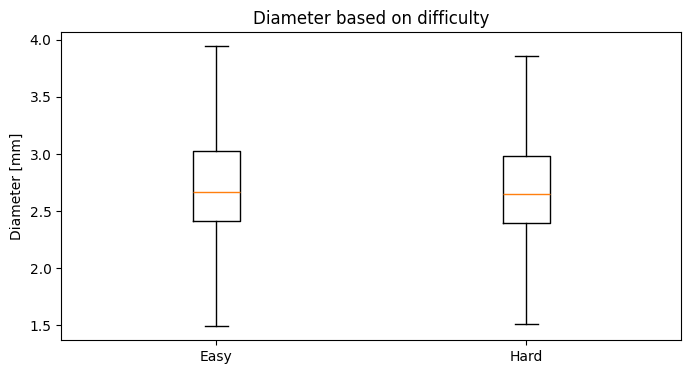

Easy: 2.73 mm (~0.53)
Hard: 2.7 mm (~0.51)


In [ ]:
# Visualize
mean_easy = round(np.mean(diameter_df_easy), 2)
mean_hard = round(np.mean(diameter_df_hard), 2)
std_easy = round(np.std(diameter_df_easy), 2)
std_hard = round(np.std(diameter_df_hard), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([diameter_df_easy, diameter_df_hard], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on difficulty')
plt.xticks([1, 2], ['Easy', 'Hard'])
plt.ylabel('Diameter [mm]')
plt.show()

print(f"Easy: {np.mean(mean_easy)} mm (~{std_easy})")
print(f"Hard: {np.mean(mean_hard)} mm (~{std_hard})")

In [ ]:
# Diameter data based on difficulty (tasks data only)
unix_task_intervals_easy = list(gui_df_easy[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))
unix_task_intervals_hard = list(gui_df_hard[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))

diameter_ddf = data['all_pupil_positions'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
task_interval_mask_easy = pd.Series(False, index=diameter_df.index)
task_interval_mask_hard = pd.Series(False, index=diameter_df.index)

for start, end in unix_task_intervals_easy:
    task_interval_mask_easy |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, end in unix_task_intervals_hard:
    task_interval_mask_hard |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

task_diameter_df_easy = diameter_df.loc[task_interval_mask_easy, 'diameter_3d']
task_diameter_df_hard = diameter_df.loc[task_interval_mask_hard, 'diameter_3d']

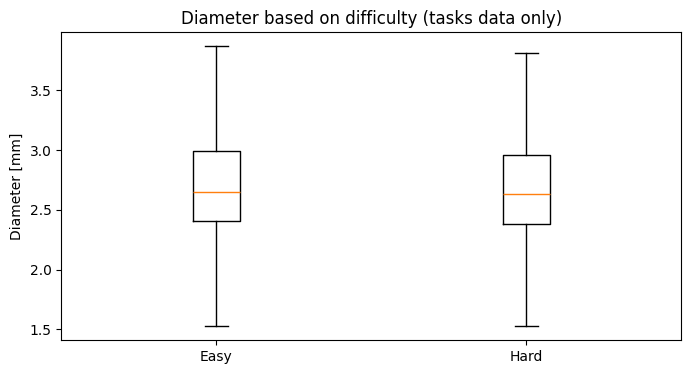

[tasks data only]
Easy: 2.73 mm (~0.52)
Hard: 2.69 mm (~0.49)


In [ ]:
# Visualize (tasks data only)
mean_easy = round(np.mean(task_diameter_df_easy), 2)
mean_hard = round(np.mean(task_diameter_df_hard), 2)
std_easy = round(np.std(task_diameter_df_easy), 2)
std_hard = round(np.std(task_diameter_df_hard), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([task_diameter_df_easy, task_diameter_df_hard], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on difficulty (tasks data only)')
plt.xticks([1, 2], ['Easy', 'Hard'])
plt.ylabel('Diameter [mm]')
plt.show()

print("[tasks data only]")
print(f"Easy: {np.mean(mean_easy)} mm (~{std_easy})")
print(f"Hard: {np.mean(mean_hard)} mm (~{std_hard})")

##### Frequency - Pupil diameter
- No correlation

In [ ]:
# Diameter data based on frequency
unix_intervals_slow = gui_df_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_fast = gui_df_fast['block_data'].apply(tuple).unique().tolist()

diameter_ddf = data['all_pupil_positions'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
interval_mask_slow = pd.Series(False, index=diameter_df.index)
interval_mask_fast = pd.Series(False, index=diameter_df.index)

for start, _, end in unix_intervals_slow:
    interval_mask_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, _, end in unix_intervals_fast:
    interval_mask_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

diameter_df_slow = diameter_df.loc[interval_mask_slow, 'diameter_3d']
diameter_df_fast = diameter_df.loc[interval_mask_fast, 'diameter_3d']

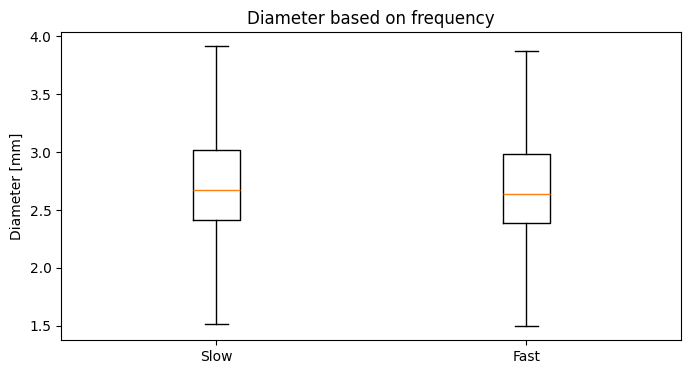

Slow: 2.72 mm (~0.52)
Fast: 2.71 mm (~0.53)


In [ ]:
# Visualize
mean_slow = round(np.mean(diameter_df_slow), 2)
mean_fast = round(np.mean(diameter_df_fast), 2)
std_slow = round(np.std(diameter_df_slow), 2)
std_fast = round(np.std(diameter_df_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([diameter_df_slow, diameter_df_fast], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on frequency')
plt.xticks([1, 2], ['Slow', 'Fast'])
plt.ylabel('Diameter [mm]')
plt.show()

print(f"Slow: {np.mean(mean_slow)} mm (~{std_slow})")
print(f"Fast: {np.mean(mean_fast)} mm (~{std_fast})")

In [ ]:
# Diameter data based on frequency (tasks data only)
unix_task_intervals_slow = list(gui_df_slow[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))
unix_task_intervals_fast = list(gui_df_fast[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))

diameter_ddf = data['all_pupil_positions'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
task_interval_mask_slow = pd.Series(False, index=diameter_df.index)
task_interval_mask_fast = pd.Series(False, index=diameter_df.index)

for start, end in unix_task_intervals_slow:
    task_interval_mask_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, end in unix_task_intervals_fast:
    task_interval_mask_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

task_diameter_df_slow = diameter_df.loc[task_interval_mask_slow, 'diameter_3d']
task_diameter_df_fast = diameter_df.loc[task_interval_mask_fast, 'diameter_3d']

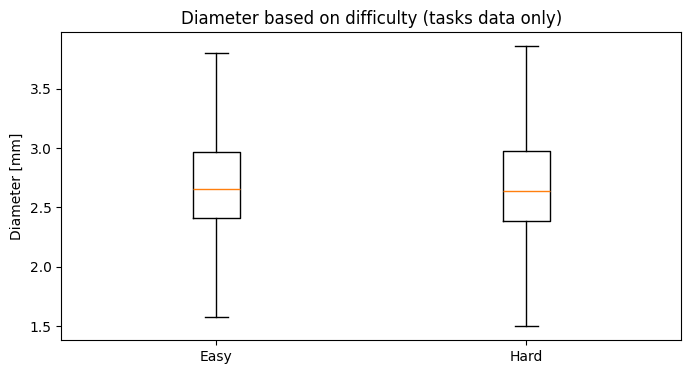

[tasks data only]
Easy: 2.71 mm (~0.48)
Hard: 2.71 mm (~0.52)


In [ ]:
# Visualize (tasks data only)
mean_easy = round(np.mean(task_diameter_df_slow), 2)
mean_hard = round(np.mean(task_diameter_df_fast), 2)
std_easy = round(np.std(task_diameter_df_slow), 2)
std_hard = round(np.std(task_diameter_df_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([task_diameter_df_slow, task_diameter_df_fast], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on difficulty (tasks data only)')
plt.xticks([1, 2], ['Easy', 'Hard'])
plt.ylabel('Diameter [mm]')
plt.show()

print("[tasks data only]")
print(f"Easy: {np.mean(mean_easy)} mm (~{std_easy})")
print(f"Hard: {np.mean(mean_hard)} mm (~{std_hard})")

##### Difficulty&Frequency - Pupil diameter
- No correlation

In [ ]:
# Diameter data based on difficulty+frequency
unix_intervals_easy_slow = gui_df_easy_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_slow = gui_df_hard_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_easy_fast = gui_df_easy_fast['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_fast = gui_df_hard_fast['block_data'].apply(tuple).unique().tolist()

diameter_ddf = data['all_pupil_positions'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
interval_mask_easy_slow = pd.Series(False, index=diameter_df.index)
interval_mask_hard_slow = pd.Series(False, index=diameter_df.index)
interval_mask_easy_fast = pd.Series(False, index=diameter_df.index)
interval_mask_hard_fast = pd.Series(False, index=diameter_df.index)

for start, _, end in unix_intervals_easy_slow:
    interval_mask_easy_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_slow:
    interval_mask_hard_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, _, end in unix_intervals_easy_fast:
    interval_mask_easy_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_fast:
    interval_mask_hard_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

diameter_df_easy_slow = diameter_df.loc[interval_mask_easy_slow, 'diameter_3d']
diameter_df_hard_slow = diameter_df.loc[interval_mask_hard_slow, 'diameter_3d']
diameter_df_easy_fast = diameter_df.loc[interval_mask_easy_fast, 'diameter_3d']
diameter_df_hard_fast = diameter_df.loc[interval_mask_hard_fast, 'diameter_3d']

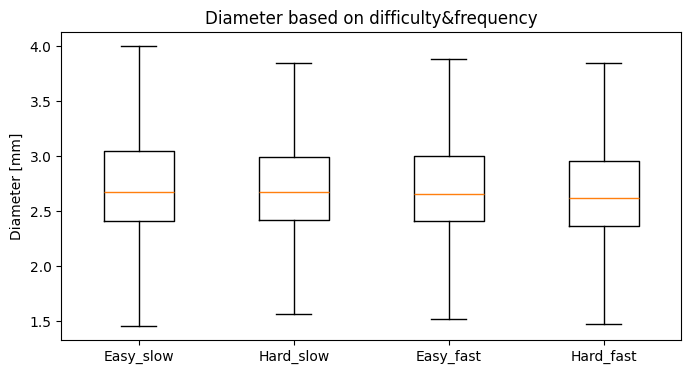

Easy_slow: 2.73 mm (~0.52)
Hard_slow: 2.72 mm (~0.51)
Easy_fast: 2.74 mm (~0.54)
Hard_fast: 2.68 mm (~0.51)


In [ ]:
# Visualize
mean_easy_slow = round(np.mean(diameter_df_easy_slow), 2)
mean_hard_slow = round(np.mean(diameter_df_hard_slow), 2)
mean_easy_fast = round(np.mean(diameter_df_easy_fast), 2)
mean_hard_fast = round(np.mean(diameter_df_hard_fast), 2)
std_easy_slow = round(np.std(diameter_df_easy_slow), 2)
std_hard_slow = round(np.std(diameter_df_hard_slow), 2)
std_easy_fast = round(np.std(diameter_df_easy_fast), 2)
std_hard_fast = round(np.std(diameter_df_hard_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([diameter_df_easy_slow, diameter_df_hard_slow, diameter_df_easy_fast, diameter_df_hard_fast], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on difficulty&frequency')
plt.xticks([1, 2, 3, 4], ['Easy_slow', 'Hard_slow', 'Easy_fast', 'Hard_fast'])
plt.ylabel('Diameter [mm]')
plt.show()

print(f"Easy_slow: {np.mean(mean_easy_slow)} mm (~{std_easy_slow})")
print(f"Hard_slow: {np.mean(mean_hard_slow)} mm (~{std_hard_slow})")
print(f"Easy_fast: {np.mean(mean_easy_fast)} mm (~{std_easy_fast})")
print(f"Hard_fast: {np.mean(mean_hard_fast)} mm (~{std_hard_fast})")

In [ ]:
# Diameter data based on difficulty+frequency
unix_task_intervals_easy_slow = list(gui_df_easy_slow[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))
unix_task_intervals_hard_slow = list(gui_df_hard_slow[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))
unix_task_intervals_easy_fast = list(gui_df_easy_fast[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))
unix_task_intervals_hard_fast = list(gui_df_hard_fast[['start_timestamp', 'end_timestamp']].itertuples(index=False, name=None))

diameter_ddf = data['all_pupil_positions'].loc[:, ['pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()

# Get diameter intervals
task_interval_mask_easy_slow = pd.Series(False, index=diameter_df.index)
task_interval_mask_hard_slow = pd.Series(False, index=diameter_df.index)
task_interval_mask_easy_fast = pd.Series(False, index=diameter_df.index)
task_interval_mask_hard_fast = pd.Series(False, index=diameter_df.index)

for start, end in unix_task_intervals_easy_slow:
    task_interval_mask_easy_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, end in unix_task_intervals_hard_slow:
    task_interval_mask_hard_slow |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, end in unix_task_intervals_easy_fast:
    task_interval_mask_easy_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)
for start, end in unix_task_intervals_hard_fast:
    task_interval_mask_hard_fast |= (diameter_df['pupil_timestamp_unix'] >= start) & (diameter_df['pupil_timestamp_unix'] <= end)

task_diameter_df_easy_slow = diameter_df.loc[task_interval_mask_easy_slow, 'diameter_3d']
task_diameter_df_hard_slow = diameter_df.loc[task_interval_mask_hard_slow, 'diameter_3d']
task_diameter_df_easy_fast = diameter_df.loc[task_interval_mask_easy_fast, 'diameter_3d']
task_diameter_df_hard_fast = diameter_df.loc[task_interval_mask_hard_fast, 'diameter_3d']

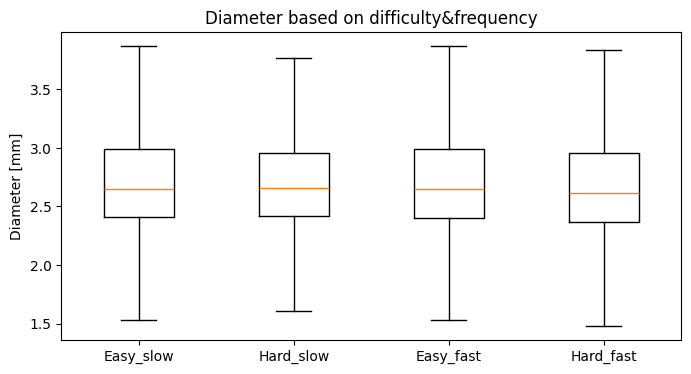

Easy_slow: 2.72 mm (~0.49)
Hard_slow: 2.7 mm (~0.47)
Easy_fast: 2.73 mm (~0.54)
Hard_fast: 2.68 mm (~0.51)


In [ ]:
# Visualize
mean_easy_slow = round(np.mean(task_diameter_df_easy_slow), 2)
mean_hard_slow = round(np.mean(task_diameter_df_hard_slow), 2)
mean_easy_fast = round(np.mean(task_diameter_df_easy_fast), 2)
mean_hard_fast = round(np.mean(task_diameter_df_hard_fast), 2)
std_easy_slow = round(np.std(task_diameter_df_easy_slow), 2)
std_hard_slow = round(np.std(task_diameter_df_hard_slow), 2)
std_easy_fast = round(np.std(task_diameter_df_easy_fast), 2)
std_hard_fast = round(np.std(task_diameter_df_hard_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([task_diameter_df_easy_slow, task_diameter_df_hard_slow, task_diameter_df_easy_fast, task_diameter_df_hard_fast], whis = 1.5, showfliers=False)
plt.title(f'Diameter based on difficulty&frequency')
plt.xticks([1, 2, 3, 4], ['Easy_slow', 'Hard_slow', 'Easy_fast', 'Hard_fast'])
plt.ylabel('Diameter [mm]')
plt.show()

print(f"Easy_slow: {np.mean(mean_easy_slow)} mm (~{std_easy_slow})")
print(f"Hard_slow: {np.mean(mean_hard_slow)} mm (~{std_hard_slow})")
print(f"Easy_fast: {np.mean(mean_easy_fast)} mm (~{std_easy_fast})")
print(f"Hard_fast: {np.mean(mean_hard_fast)} mm (~{std_hard_fast})")

##### Reaction time - Pupil diameter
- Mixed results
- Positive in: P01, P02, P05, P09, P10, P18, P20
- Neutral in: P04, P06, P11, P13, P14, P15, P16, P17
- Negative in: P07, P08, P12, P19

In [ ]:
# Diameter data based on reaction time
rt_gui_df = gui_df[['participant_id', 'start_timestamp', 'reaction_time', 'clicked_timestamp']].dropna()
diameter_ddf = data['all_pupil_positions'].loc[:, ['participant_id', 'pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()
correlation_results = []
pupil_reaction_offset = 1 # second

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_diameter_df = diameter_df.query(f"participant_id == {pid}")
    mean_diameters = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['start_timestamp'] + pupil_reaction_offset
        end = row['clicked_timestamp'] + pupil_reaction_offset
        diameter_in_interval = p_diameter_df[(p_diameter_df['pupil_timestamp_unix'] >= start) & 
                                             (p_diameter_df['pupil_timestamp_unix'] <= end)]
        
        mean_diameter = diameter_in_interval['diameter_3d'].mean()
        mean_diameters.append(mean_diameter)
    
    p_rt_gui_df['mean_diameter'] = mean_diameters
    correlation = p_rt_gui_df['reaction_time'].corr(p_rt_gui_df['mean_diameter'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


Mean Correlation: 0.05698036788783163
Std Correlation: 0.1794197709839782
    participant_id  correlation
0                1     0.355326
1                2     0.302257
2                4     0.077585
3                5     0.375173
4                6     0.020179
5                7    -0.223175
6                8    -0.196288
7                9     0.178871
8               10     0.218558
9               11    -0.040036
10              12    -0.146289
11              13    -0.085790
12              14     0.080535
13              15    -0.029896
14              16     0.024751
15              17    -0.006013
16              18     0.125617
17              19    -0.136778
18              20     0.188041


##### Completion time - Pupil diameter
- Mixed results
- Positive in: P06, P14, P16
- Neutral in: P01, P04, P05, P10, P11, P13, P15, P17, P20
- Negative in: P02, P07, P08, P09, P12, P18, P19

In [ ]:
# Diameter data based on completion time
rt_gui_df = gui_df[['participant_id', 'clicked_timestamp', 'completion_time', 'end_timestamp']].dropna()
diameter_ddf = data['all_pupil_positions'].loc[:, ['participant_id', 'pupil_timestamp_unix', 'diameter_3d']].dropna()
diameter_df = diameter_ddf.compute()
correlation_results = []

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_diameter_df = diameter_df.query(f"participant_id == {pid}")
    mean_diameters = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['clicked_timestamp']
        end = row['end_timestamp']
        diameter_in_interval = p_diameter_df[(p_diameter_df['pupil_timestamp_unix'] >= start) & 
                                             (p_diameter_df['pupil_timestamp_unix'] <= end)]
        
        mean_diameter = diameter_in_interval['diameter_3d'].mean()
        mean_diameters.append(mean_diameter)
    
    p_rt_gui_df['mean_diameter'] = mean_diameters
    correlation = p_rt_gui_df['completion_time'].corr(p_rt_gui_df['mean_diameter'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


Mean Correlation: -0.04913505039645932
Std Correlation: 0.19728356406893874
    participant_id  correlation
0                1    -0.026458
1                2    -0.238638
2                4     0.086592
3                5    -0.070629
4                6     0.102710
5                7    -0.191781
6                8    -0.179938
7                9    -0.294313
8               10     0.088889
9               11    -0.039093
10              12    -0.195080
11              13     0.061526
12              14     0.465295
13              15    -0.068846
14              16     0.196244
15              17     0.014511
16              18    -0.238559
17              19    -0.375370
18              20    -0.030629


##### Difficulty - Fixation duration
- Slightly longer in easy condition

In [ ]:
# Duration data based on difficulty
unix_intervals_easy = gui_df_easy['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard = gui_df_hard['block_data'].apply(tuple).unique().tolist()

duration_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'duration']].dropna()
duration_df = duration_ddf.compute()

# Get duration intervals
interval_mask_easy = pd.Series(False, index=duration_df.index)
interval_mask_hard = pd.Series(False, index=duration_df.index)

for start, _, end in unix_intervals_easy:
    interval_mask_easy |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard:
    interval_mask_hard |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)

duration_df_easy = duration_df.loc[interval_mask_easy, 'duration']
duration_df_hard = duration_df.loc[interval_mask_hard, 'duration']

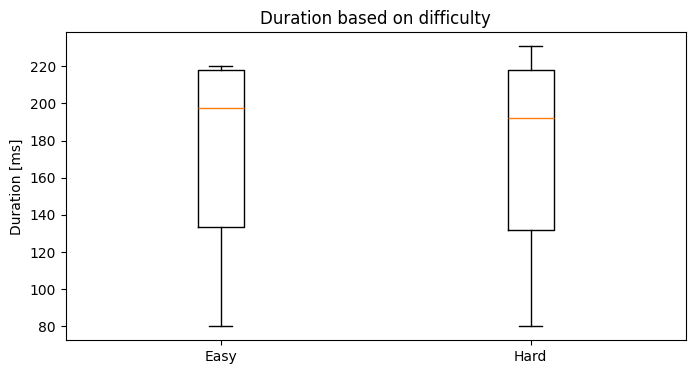

Easy: 175.24 ms (~48.38)
Hard: 173.81 ms (~48.44)


In [ ]:
# Visualize
mean_easy = round(np.mean(duration_df_easy), 2)
mean_hard = round(np.mean(duration_df_hard), 2)
std_easy = round(np.std(duration_df_easy), 2)
std_hard = round(np.std(duration_df_hard), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([duration_df_easy, duration_df_hard], whis = 1.5, showfliers=False)
plt.title(f'Duration based on difficulty')
plt.xticks([1, 2], ['Easy', 'Hard'])
plt.ylabel('Duration [ms]')
plt.show()

print(f"Easy: {np.mean(mean_easy)} ms (~{std_easy})")
print(f"Hard: {np.mean(mean_hard)} ms (~{std_hard})")

##### Frequency - Fixation duration
- Slightly longer in slow condition

In [ ]:
# Duration data based on frequency
unix_intervals_slow = gui_df_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_fast = gui_df_fast['block_data'].apply(tuple).unique().tolist()

duration_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'duration']].dropna()
duration_df = duration_ddf.compute()

# Get duration intervals
interval_mask_slow = pd.Series(False, index=duration_df.index)
interval_mask_fast = pd.Series(False, index=duration_df.index)

for start, _, end in unix_intervals_slow:
    interval_mask_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_fast:
    interval_mask_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)

duration_df_slow = duration_df.loc[interval_mask_slow, 'duration']
duration_df_fast = duration_df.loc[interval_mask_fast, 'duration']

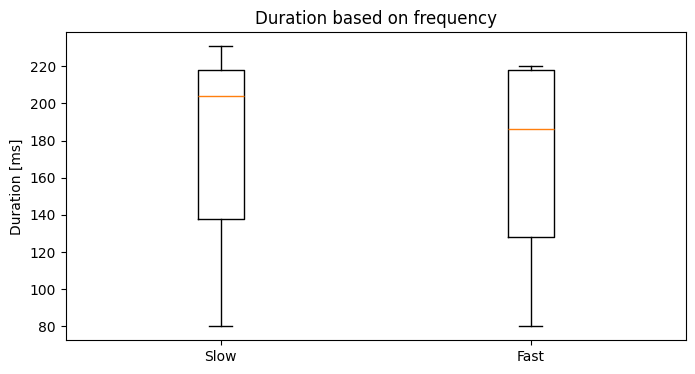

Slow: 177.76 ms (~47.83)
Fast: 171.32 ms (~48.78)


In [ ]:
# Visualize
mean_slow = round(np.mean(duration_df_slow), 2)
mean_fast = round(np.mean(duration_df_fast), 2)
std_slow = round(np.std(duration_df_slow), 2)
std_fast = round(np.std(duration_df_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([duration_df_slow, duration_df_fast], whis = 1.5, showfliers=False)
plt.title(f'Duration based on frequency')
plt.xticks([1, 2], ['Slow', 'Fast'])
plt.ylabel('Duration [ms]')
plt.show()

print(f"Slow: {np.mean(mean_slow)} ms (~{std_slow})")
print(f"Fast: {np.mean(mean_fast)} ms (~{std_fast})")

##### Difficulty&Frequency - Fixation duration
- Slightly longer in slow condition

In [ ]:
# Diameter data based on difficulty+frequency
unix_intervals_easy_slow = gui_df_easy_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_slow = gui_df_hard_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_easy_fast = gui_df_easy_fast['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_fast = gui_df_hard_fast['block_data'].apply(tuple).unique().tolist()

duration_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'duration']].dropna()
duration_df = duration_ddf.compute()

# Get diameter intervals
interval_mask_easy_slow = pd.Series(False, index=duration_df.index)
interval_mask_hard_slow = pd.Series(False, index=duration_df.index)
interval_mask_easy_fast = pd.Series(False, index=duration_df.index)
interval_mask_hard_fast = pd.Series(False, index=duration_df.index)

for start, _, end in unix_intervals_easy_slow:
    interval_mask_easy_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_slow:
    interval_mask_hard_slow |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_easy_fast:
    interval_mask_easy_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_fast:
    interval_mask_hard_fast |= (duration_df['start_timestamp_unix'] >= start) & (duration_df['start_timestamp_unix'] <= end)

duration_df_easy_slow = duration_df.loc[interval_mask_easy_slow, 'duration']
duration_df_hard_slow = duration_df.loc[interval_mask_hard_slow, 'duration']
duration_df_easy_fast = duration_df.loc[interval_mask_easy_fast, 'duration']
duration_df_hard_fast = duration_df.loc[interval_mask_hard_fast, 'duration']

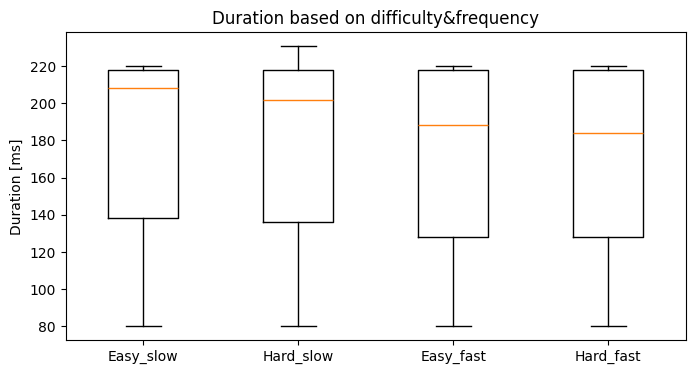

Easy_slow: 178.53 ms (~47.74)
Hard_slow: 177.03 ms (~47.91)
Easy_fast: 172.04 ms (~48.79)
Hard_fast: 170.63 ms (~48.76)


In [ ]:
# Visualize
mean_easy_slow = round(np.mean(duration_df_easy_slow), 2)
mean_hard_slow = round(np.mean(duration_df_hard_slow), 2)
mean_easy_fast = round(np.mean(duration_df_easy_fast), 2)
mean_hard_fast = round(np.mean(duration_df_hard_fast), 2)
std_easy_slow = round(np.std(duration_df_easy_slow), 2)
std_hard_slow = round(np.std(duration_df_hard_slow), 2)
std_easy_fast = round(np.std(duration_df_easy_fast), 2)
std_hard_fast = round(np.std(duration_df_hard_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([duration_df_easy_slow, duration_df_hard_slow, duration_df_easy_fast, duration_df_hard_fast], whis = 1.5, showfliers=False)
plt.title(f'Duration based on difficulty&frequency')
plt.xticks([1, 2, 3, 4], ['Easy_slow', 'Hard_slow', 'Easy_fast', 'Hard_fast'])
plt.ylabel('Duration [ms]')
plt.show()

print(f"Easy_slow: {np.mean(mean_easy_slow)} ms (~{std_easy_slow})")
print(f"Hard_slow: {np.mean(mean_hard_slow)} ms (~{std_hard_slow})")
print(f"Easy_fast: {np.mean(mean_easy_fast)} ms (~{std_easy_fast})")
print(f"Hard_fast: {np.mean(mean_hard_fast)} ms (~{std_hard_fast})")

##### Reaction time - Fixation duration
- Mixed results
- Positive in: P01, P04, P06, P09, P12, P13, P15
- Neutral in: P02, P05, P07, P08, P10, P16, P17, P20
- Negative in: P11, P14, P18, P19

In [ ]:
# Fixation duration data based on reaction time
rt_gui_df = gui_df[['participant_id', 'start_timestamp', 'reaction_time', 'clicked_timestamp']].dropna()
duration_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True").loc[:, ['participant_id', 'start_timestamp_unix', 'duration']].dropna()
duration_df = duration_ddf.compute()
correlation_results = []

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_duration_df = duration_df.query(f"participant_id == {pid}")
    mean_durations = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['start_timestamp']
        end = row['clicked_timestamp']
        duration_in_interval = p_duration_df[(p_duration_df['start_timestamp_unix'] >= start) & 
                                             (p_duration_df['start_timestamp_unix'] <= end)]
        
        mean_duration = duration_in_interval['duration'].mean()
        mean_durations.append(mean_duration)
    
    p_rt_gui_df['mean_duration'] = mean_durations
    correlation = p_rt_gui_df['reaction_time'].corr(p_rt_gui_df['mean_duration'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


Mean Correlation: 0.012012874699339357
Std Correlation: 0.1351845437628257
    participant_id  correlation
0                1     0.166328
1                2    -0.039588
2                4     0.204908
3                5    -0.071960
4                6     0.188729
5                7    -0.077899
6                8     0.080309
7                9     0.128878
8               10    -0.007328
9               11    -0.166041
10              12     0.116522
11              13     0.131187
12              14    -0.231522
13              15     0.138095
14              16    -0.012560
15              17    -0.010961
16              18    -0.149749
17              19    -0.189330
18              20     0.030227


##### Completion time - Fixation duration
- Overall positive correlation
- Positive in: P01, P04, P06, P07, P08, P09, P10, P11, P12, P13, P15, P17, P18, P20
- Neutral in: P14, P16, 
- Negative in: P02, P05, P19

In [ ]:
# Fixation duration data based on completion time
rt_gui_df = gui_df[['participant_id', 'clicked_timestamp', 'completion_time', 'end_timestamp']].dropna()
duration_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True").loc[:, ['participant_id', 'start_timestamp_unix', 'duration']].dropna()
duration_df = duration_ddf.compute()
correlation_results = []

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_duration_df = duration_df.query(f"participant_id == {pid}")
    mean_durations = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['clicked_timestamp']
        end = row['end_timestamp']
        duration_in_interval = p_duration_df[(p_duration_df['start_timestamp_unix'] >= start) & 
                                             (p_duration_df['start_timestamp_unix'] <= end)]
        
        mean_duration = duration_in_interval['duration'].mean()
        mean_durations.append(mean_duration)
    
    p_rt_gui_df['mean_duration'] = mean_durations
    correlation = p_rt_gui_df['completion_time'].corr(p_rt_gui_df['mean_duration'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


Mean Correlation: 0.13473771922234146
Std Correlation: 0.14344897178928084
    participant_id  correlation
0                1     0.122024
1                2    -0.270777
2                4     0.302857
3                5    -0.104739
4                6     0.218781
5                7     0.157352
6                8     0.257718
7                9     0.150008
8               10     0.216770
9               11     0.180689
10              12     0.236082
11              13     0.211304
12              14     0.041348
13              15     0.236762
14              16     0.098917
15              17     0.256882
16              18     0.117136
17              19    -0.050803
18              20     0.181707


##### Difficulty - Fixation dispersion
- No correlation

In [ ]:
# Dispersion data based on difficulty
unix_intervals_easy = gui_df_easy['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard = gui_df_hard['block_data'].apply(tuple).unique().tolist()

dispersion_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'dispersion']].dropna()
dispersion_df = dispersion_ddf.compute()

# Get dispersion intervals
interval_mask_easy = pd.Series(False, index=dispersion_df.index)
interval_mask_hard = pd.Series(False, index=dispersion_df.index)

for start, _, end in unix_intervals_easy:
    interval_mask_easy |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard:
    interval_mask_hard |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)

dispersion_df_easy = dispersion_df.loc[interval_mask_easy, 'dispersion']
dispersion_df_hard = dispersion_df.loc[interval_mask_hard, 'dispersion']

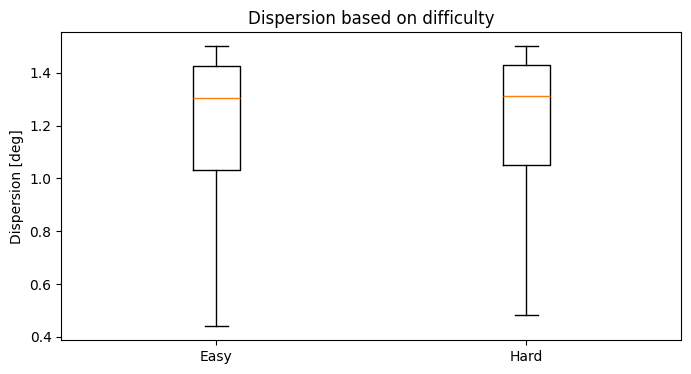

Easy: 1.2 deg (~0.27)
Hard: 1.21 deg (~0.27)


In [ ]:
# Visualize
mean_easy = round(np.mean(dispersion_df_easy), 2)
mean_hard = round(np.mean(dispersion_df_hard), 2)
std_easy = round(np.std(dispersion_df_easy), 2)
std_hard = round(np.std(dispersion_df_hard), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([dispersion_df_easy, dispersion_df_hard], whis = 1.5, showfliers=False)
plt.title(f'Dispersion based on difficulty')
plt.xticks([1, 2], ['Easy', 'Hard'])
plt.ylabel('Dispersion [deg]')
plt.show()

print(f"Easy: {np.mean(mean_easy)} deg (~{std_easy})")
print(f"Hard: {np.mean(mean_hard)} deg (~{std_hard})")

##### Frequency - Fixation dispersion
- Very slightly more spread in fast condition

In [ ]:
# Dispersion data based on frequency
unix_intervals_slow = gui_df_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_fast = gui_df_fast['block_data'].apply(tuple).unique().tolist()

dispersion_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'dispersion']].dropna()
dispersion_df = dispersion_ddf.compute()

# Get dispersion intervals
interval_mask_slow = pd.Series(False, index=dispersion_df.index)
interval_mask_fast = pd.Series(False, index=dispersion_df.index)

for start, _, end in unix_intervals_slow:
    interval_mask_slow |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_fast:
    interval_mask_fast |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)

dispersion_df_slow = dispersion_df.loc[interval_mask_slow, 'dispersion']
dispersion_df_fast = dispersion_df.loc[interval_mask_fast, 'dispersion']

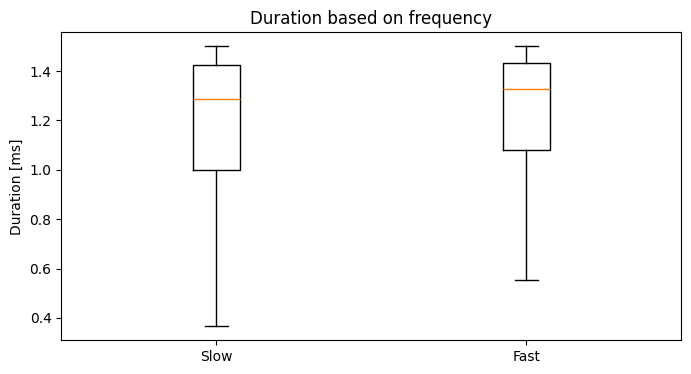

Slow: 1.19 ms (~0.28)
Fast: 1.23 ms (~0.26)


In [ ]:
# Visualize
mean_slow = round(np.mean(dispersion_df_slow), 2)
mean_fast = round(np.mean(dispersion_df_fast), 2)
std_slow = round(np.std(dispersion_df_slow), 2)
std_fast = round(np.std(dispersion_df_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([dispersion_df_slow, dispersion_df_fast], whis = 1.5, showfliers=False)
plt.title(f'Duration based on frequency')
plt.xticks([1, 2], ['Slow', 'Fast'])
plt.ylabel('Duration [ms]')
plt.show()

print(f"Slow: {np.mean(mean_slow)} ms (~{std_slow})")
print(f"Fast: {np.mean(mean_fast)} ms (~{std_fast})")

##### Difficulty&Frequency - Fixation dispersion
- Very slightly more spread in fast condition

In [ ]:
# Dispersion data based on difficulty+frequency
unix_intervals_easy_slow = gui_df_easy_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_slow = gui_df_hard_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_easy_fast = gui_df_easy_fast['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_fast = gui_df_hard_fast['block_data'].apply(tuple).unique().tolist()

dispersion_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True").loc[:, ['start_timestamp_unix', 'dispersion']].dropna()
dispersion_df = dispersion_ddf.compute()

# Get dispersion intervals
interval_mask_easy_slow = pd.Series(False, index=dispersion_df.index)
interval_mask_hard_slow = pd.Series(False, index=dispersion_df.index)
interval_mask_easy_fast = pd.Series(False, index=dispersion_df.index)
interval_mask_hard_fast = pd.Series(False, index=dispersion_df.index)

for start, _, end in unix_intervals_easy_slow:
    interval_mask_easy_slow |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_slow:
    interval_mask_hard_slow |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_easy_fast:
    interval_mask_easy_fast |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_fast:
    interval_mask_hard_fast |= (dispersion_df['start_timestamp_unix'] >= start) & (dispersion_df['start_timestamp_unix'] <= end)

dispersion_df_easy_slow = dispersion_df.loc[interval_mask_easy_slow, 'dispersion']
dispersion_df_hard_slow = dispersion_df.loc[interval_mask_hard_slow, 'dispersion']
dispersion_df_easy_fast = dispersion_df.loc[interval_mask_easy_fast, 'dispersion']
dispersion_df_hard_fast = dispersion_df.loc[interval_mask_hard_fast, 'dispersion']

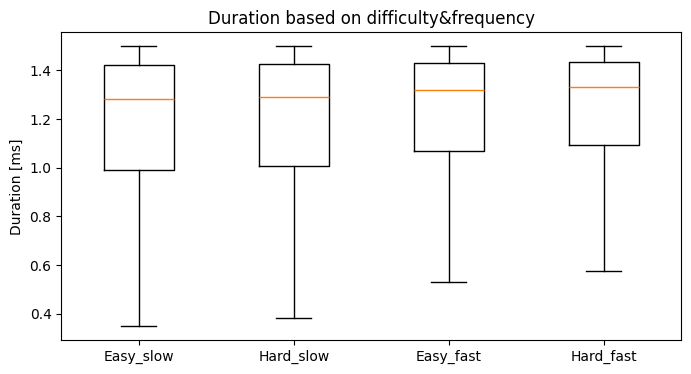

Easy_slow: 1.18 ms (~0.28)
Hard_slow: 1.19 ms (~0.28)
Easy_fast: 1.23 ms (~0.26)
Hard_fast: 1.24 ms (~0.25)


In [ ]:
# Visualize
mean_easy_slow = round(np.mean(dispersion_df_easy_slow), 2)
mean_hard_slow = round(np.mean(dispersion_df_hard_slow), 2)
mean_easy_fast = round(np.mean(dispersion_df_easy_fast), 2)
mean_hard_fast = round(np.mean(dispersion_df_hard_fast), 2)
std_easy_slow = round(np.std(dispersion_df_easy_slow), 2)
std_hard_slow = round(np.std(dispersion_df_hard_slow), 2)
std_easy_fast = round(np.std(dispersion_df_easy_fast), 2)
std_hard_fast = round(np.std(dispersion_df_hard_fast), 2)

plt.figure(figsize=(8, 4))
plt.boxplot([dispersion_df_easy_slow, dispersion_df_hard_slow, dispersion_df_easy_fast, dispersion_df_hard_fast], whis = 1.5, showfliers=False)
plt.title(f'Duration based on difficulty&frequency')
plt.xticks([1, 2, 3, 4], ['Easy_slow', 'Hard_slow', 'Easy_fast', 'Hard_fast'])
plt.ylabel('Duration [ms]')
plt.show()

print(f"Easy_slow: {np.mean(mean_easy_slow)} ms (~{std_easy_slow})")
print(f"Hard_slow: {np.mean(mean_hard_slow)} ms (~{std_hard_slow})")
print(f"Easy_fast: {np.mean(mean_easy_fast)} ms (~{std_easy_fast})")
print(f"Hard_fast: {np.mean(mean_hard_fast)} ms (~{std_hard_fast})")

##### Reaction time - Fixation dispersion
- Mixed results
- Positive in: P05, P14, P17, P19
- Neutral in: P01, P02, P07, P10, P15, P16, P18, P20
- Negative in: P04, P06, P08, P09, P11, P12, P13

In [ ]:
# Fixation dispersion data based on reaction time
rt_gui_df = gui_df[['participant_id', 'start_timestamp', 'reaction_time', 'clicked_timestamp']].dropna()
dispersion_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True").loc[:, ['participant_id', 'start_timestamp_unix', 'dispersion']].dropna()
dispersion_df = dispersion_ddf.compute()
correlation_results = []

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_dispersion_df = dispersion_df.query(f"participant_id == {pid}")
    mean_dispersions = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['start_timestamp']
        end = row['clicked_timestamp']
        dispersion_in_interval = p_dispersion_df[(p_dispersion_df['start_timestamp_unix'] >= start) & 
                                             (p_dispersion_df['start_timestamp_unix'] <= end)]
        
        mean_dispersion = dispersion_in_interval['dispersion'].mean()
        mean_dispersions.append(mean_dispersion)
    
    p_rt_gui_df['mean_dispersion'] = mean_dispersions
    correlation = p_rt_gui_df['reaction_time'].corr(p_rt_gui_df['mean_dispersion'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


Mean Correlation: -0.012977277081786628
Std Correlation: 0.14255687607045148
    participant_id  correlation
0                1    -0.012553
1                2    -0.001480
2                4    -0.164282
3                5     0.131515
4                6    -0.107489
5                7     0.071996
6                8    -0.133842
7                9    -0.198299
8               10     0.011636
9               11    -0.133818
10              12    -0.128974
11              13    -0.162842
12              14     0.135826
13              15    -0.099686
14              16     0.006147
15              17     0.284430
16              18    -0.010413
17              19     0.282275
18              20    -0.016717


##### Completion time - Fixation dispersion
- Mixed results
- Positive in: P02, P18, P19
- Neutral in: P07, P11, P13, P14, P15, P16, P17
- Negative in: P01, P04, P05, P06, P08, P09, P10, P12, P20

In [ ]:
# Fixation dispersion data based on completion time
rt_gui_df = gui_df[['participant_id', 'clicked_timestamp', 'completion_time', 'end_timestamp']].dropna()
dispersion_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True").loc[:, ['participant_id', 'start_timestamp_unix', 'dispersion']].dropna()
dispersion_df = dispersion_ddf.compute()
correlation_results = []

for pid in participant_ids:
    p_rt_gui_df = rt_gui_df.query(f"participant_id == {pid}").reset_index(drop=True)
    p_dispersion_df = dispersion_df.query(f"participant_id == {pid}")
    mean_dispersions = []
    
    for index, row in p_rt_gui_df.iterrows():
        start = row['clicked_timestamp']
        end = row['end_timestamp']
        dispersion_in_interval = p_dispersion_df[(p_dispersion_df['start_timestamp_unix'] >= start) & 
                                             (p_dispersion_df['start_timestamp_unix'] <= end)]
        
        mean_dispersion = dispersion_in_interval['dispersion'].mean()
        mean_dispersions.append(mean_dispersion)
    
    p_rt_gui_df['mean_dispersion'] = mean_dispersions
    correlation = p_rt_gui_df['completion_time'].corr(p_rt_gui_df['mean_dispersion'])
    correlation_results.append({'participant_id': pid, 'correlation': correlation})

correlation_df = pd.DataFrame(correlation_results)
print(f"Mean Correlation: {correlation_df['correlation'].mean()}")
print(f"Std Correlation: {correlation_df['correlation'].std()}")
print(correlation_df)


Mean Correlation: -0.0622948237366848
Std Correlation: 0.1462172057925778
    participant_id  correlation
0                1    -0.298055
1                2     0.235829
2                4    -0.197544
3                5    -0.107096
4                6    -0.160398
5                7     0.014041
6                8    -0.101539
7                9    -0.140615
8               10    -0.209884
9               11     0.067364
10              12    -0.137659
11              13     0.048653
12              14    -0.008888
13              15    -0.098968
14              16     0.037026
15              17    -0.059431
16              18     0.104326
17              19     0.135371
18              20    -0.306134


### 3. Gui-Ocular Visualization
Heatmap, Blink rate, Diameter, Difficulty, Frequency

In [51]:
# Define variables
# Difficulty
easy_block = [1, 2, 5, 6]
hard_block = [3, 4, 7, 8]

# Frequency
slow_block = [1, 3, 5, 7]
fast_block = [2, 4, 6, 8]

# Difficulty+Frequency
easy_slow_block = [1, 5]
easy_fast_block = [2, 6]
hard_slow_block = [3, 7]
hard_fast_block = [4, 8]

In [52]:
# Create gui dfs
gui_df_easy = gui_df[gui_df['block_type'].isin(easy_block)]
gui_df_hard = gui_df[gui_df['block_type'].isin(hard_block)]

gui_df_slow = gui_df[gui_df['block_type'].isin(slow_block)]
gui_df_fast = gui_df[gui_df['block_type'].isin(fast_block)]

gui_df_easy_slow = gui_df[gui_df['block_type'].isin(easy_slow_block)]
gui_df_hard_slow = gui_df[gui_df['block_type'].isin(hard_slow_block)]
gui_df_easy_fast = gui_df[gui_df['block_type'].isin(easy_fast_block)]
gui_df_hard_fast = gui_df[gui_df['block_type'].isin(hard_fast_block)]

##### Fixation heatmap by Difficulty
- Hard: fixations focused in the center part of the screen (explanatory text)
- Easy: fixations spread in other interest areas such as warning box, and map

In [ ]:
# Heatmap based on difficuty
unix_intervals_easy = gui_df_easy['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard = gui_df_hard['block_data'].apply(tuple).unique().tolist()

fixation_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True"). loc[:, ['participant_id', 'start_timestamp_unix', 'norm_pos_x', 'norm_pos_y']].dropna()
fixation_df = fixation_ddf.compute()
heatmap_df = fixation_df[(fixation_df['norm_pos_x'] >= 0) & (fixation_df['norm_pos_x'] <= 1) & (fixation_df['norm_pos_y'] >= 0) & (fixation_df['norm_pos_y'] <= 1)]

# Get heatmap intervals
interval_mask_easy = pd.Series(False, index=heatmap_df.index)
interval_mask_hard = pd.Series(False, index=heatmap_df.index)

for start, _, end in unix_intervals_easy:
    interval_mask_easy |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard:
    interval_mask_hard |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)

heatmap_df_easy = heatmap_df.loc[interval_mask_easy, :]
heatmap_df_hard = heatmap_df.loc[interval_mask_hard, :]

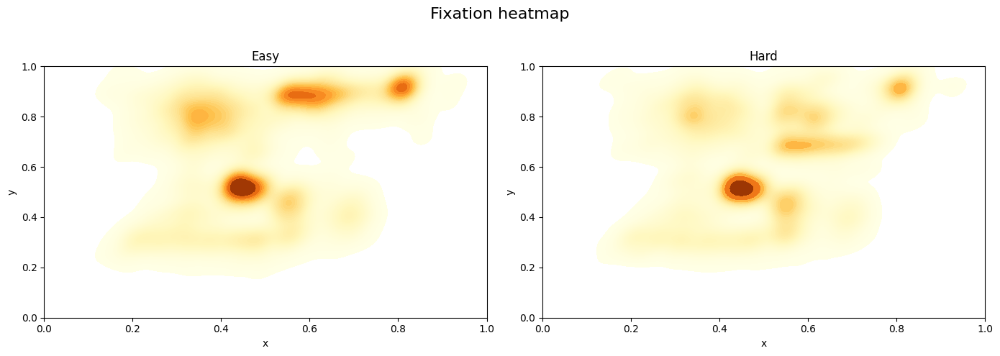

In [ ]:
# Overall heatmap
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
# Easy condition heatmap
sns.kdeplot(
    x=heatmap_df_easy['norm_pos_x'], 
    y=heatmap_df_easy['norm_pos_y'],
    levels=np.logspace(-2, 0, 100),
    hue_norm=(0,1),
    fill=True, 
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    ax=axes[0],
)
axes[0].set_title('Easy')
axes[0].set_xlim(0, 1)
axes[0].set_ylim(0, 1)
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')

# Hard condition heatmap
sns.kdeplot(
    x=heatmap_df_hard['norm_pos_x'], 
    y=heatmap_df_hard['norm_pos_y'],
    fill=True, 
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    ax=axes[1],
)
axes[1].set_title('Hard')
axes[1].set_xlim(0, 1)
axes[1].set_ylim(0, 1)
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')

# Add a unique title for the entire figure
fig.suptitle('Fixation heatmap', fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
plt.show()

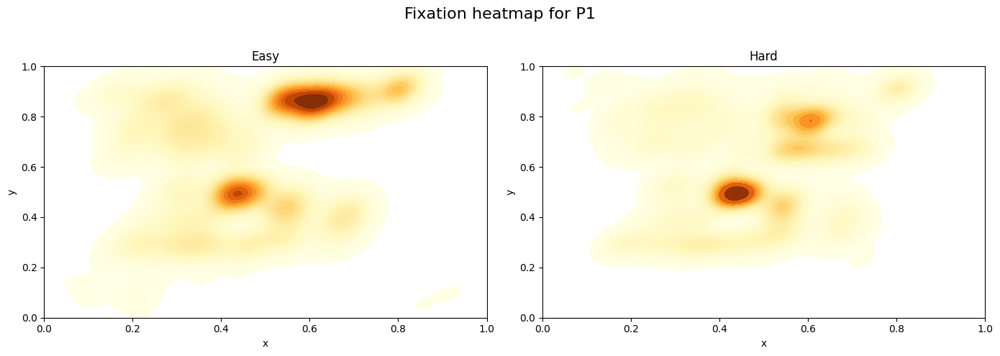

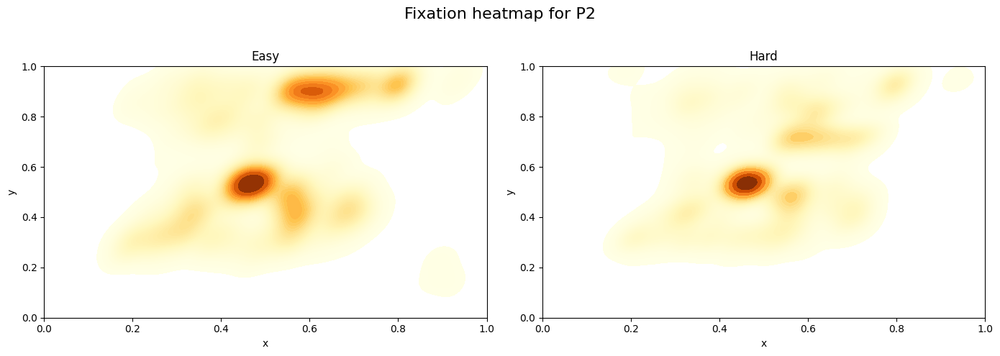

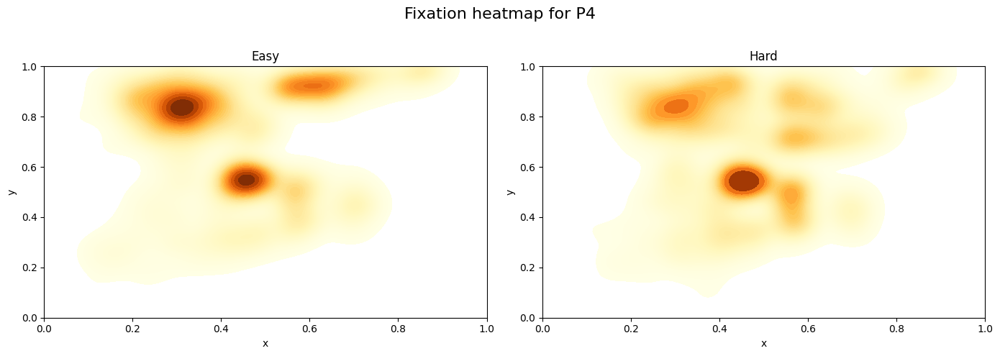

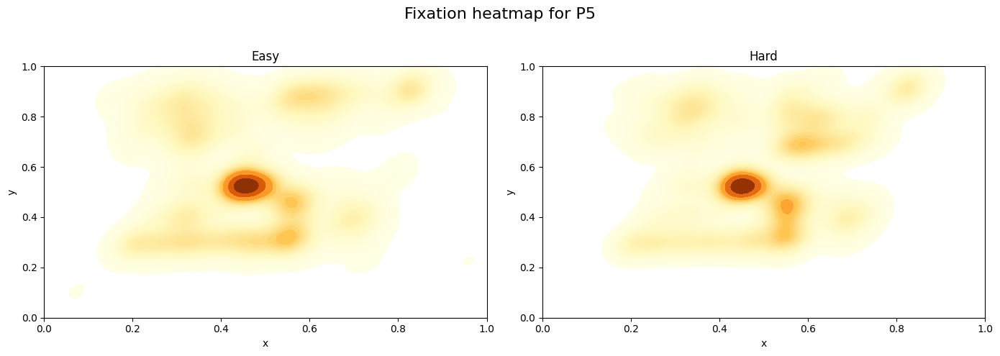

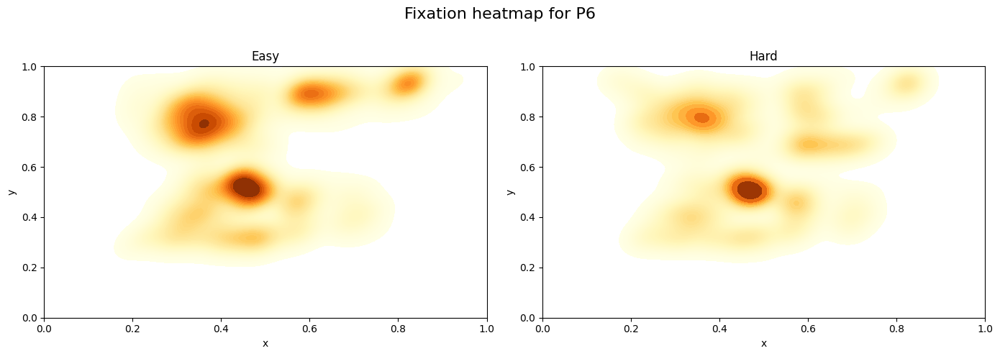

...

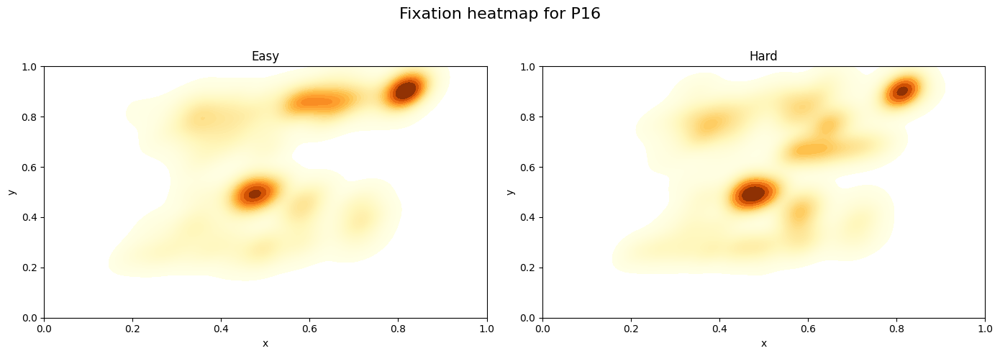

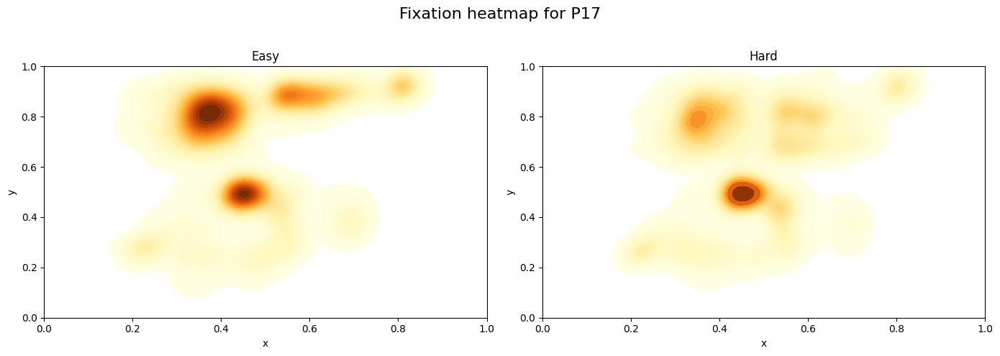

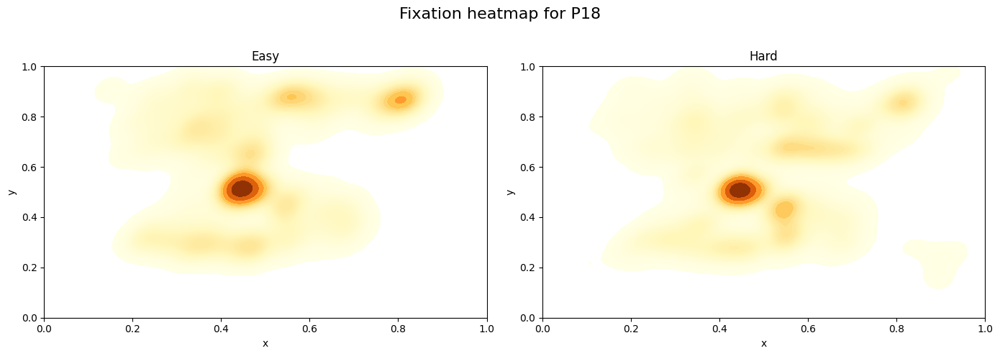

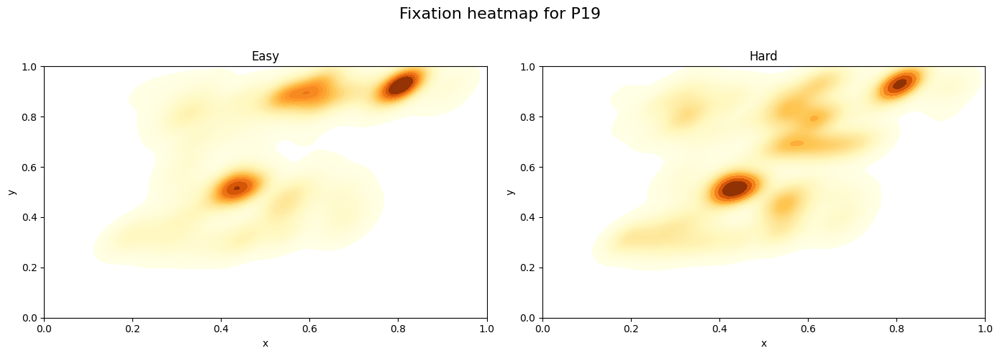

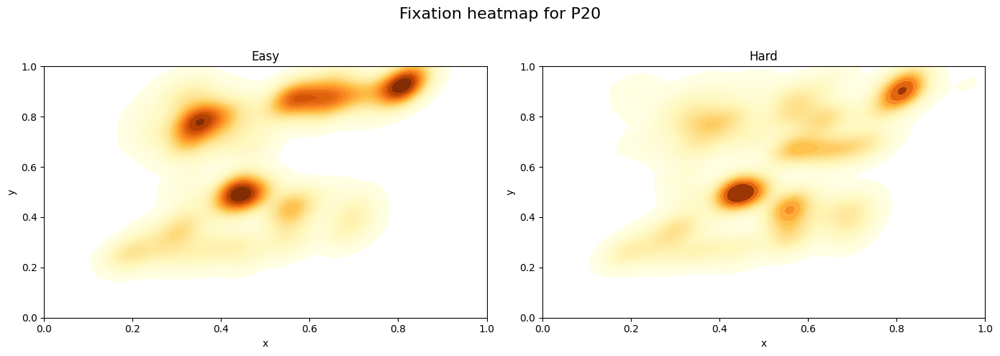

In [ ]:
for pid in participant_ids:
    participant_df_easy = heatmap_df_easy.query(f"participant_id == {pid}")
    participant_df_hard = heatmap_df_hard.query(f"participant_id == {pid}")

    # Create subplots with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))
    # Easy condition heatmap
    sns.kdeplot(
        x=participant_df_easy['norm_pos_x'], 
        y=participant_df_easy['norm_pos_y'],
        levels=np.logspace(-2, 0, 100),
        hue_norm=(0,1),
        fill=True, 
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        ax=axes[0],
    )
    axes[0].set_title('Easy')
    axes[0].set_xlim(0, 1)
    axes[0].set_ylim(0, 1)
    axes[0].set_xlabel('x')
    axes[0].set_ylabel('y')

    # Hard condition heatmap
    sns.kdeplot(
        x=participant_df_hard['norm_pos_x'], 
        y=participant_df_hard['norm_pos_y'],
        fill=True, 
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        ax=axes[1],
    )
    axes[1].set_title('Hard')
    axes[1].set_xlim(0, 1)
    axes[1].set_ylim(0, 1)
    axes[1].set_xlabel('x')
    axes[1].set_ylabel('y')

    # Add a unique title for the entire figure
    fig.suptitle(f'Fixation heatmap for P{pid}', fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
    plt.show()

##### Fixation heatmap by Frequency
- Fast: fixations focused in the centered part of the screen (explanatory text)
- Slow: besides the center (not always tho), also other areas are fixated often such as warning box and map (time-filling techniques?)

In [ ]:
# Heatmap based on frequency
unix_intervals_slow = gui_df_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_fast = gui_df_fast['block_data'].apply(tuple).unique().tolist()

fixation_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True"). loc[:, ['participant_id', 'start_timestamp_unix', 'norm_pos_x', 'norm_pos_y']].dropna()
fixation_df = fixation_ddf.compute()
heatmap_df = fixation_df[(fixation_df['norm_pos_x'] >= 0) & (fixation_df['norm_pos_x'] <= 1) & (fixation_df['norm_pos_y'] >= 0) & (fixation_df['norm_pos_y'] <= 1)]

# Get heatmap intervals
interval_mask_slow = pd.Series(False, index=heatmap_df.index)
interval_mask_fast = pd.Series(False, index=heatmap_df.index)

for start, _, end in unix_intervals_slow:
    interval_mask_slow |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_fast:
    interval_mask_fast |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)

heatmap_df_slow = heatmap_df.loc[interval_mask_slow, :]
heatmap_df_fast = heatmap_df.loc[interval_mask_fast, :]

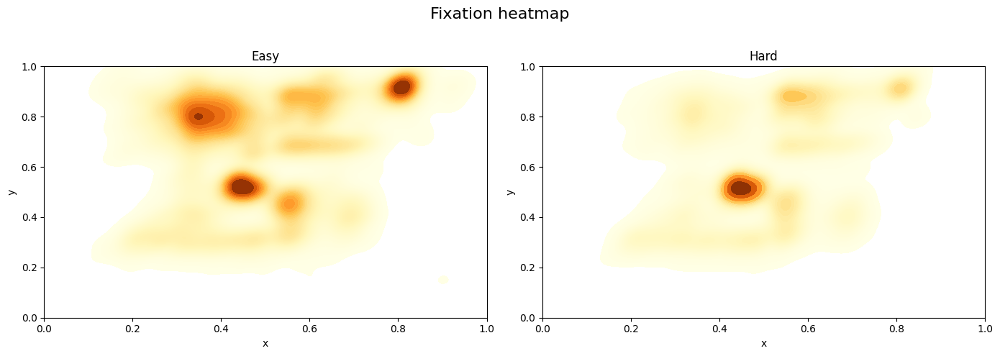

In [ ]:
# Overall heatmap
fig, axes = plt.subplots(1, 2, figsize=(14, 5))
# Easy condition heatmap
sns.kdeplot(
    x=heatmap_df_slow['norm_pos_x'], 
    y=heatmap_df_slow['norm_pos_y'],
    levels=np.logspace(-2, 0, 100),
    hue_norm=(0,1),
    fill=True, 
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    ax=axes[0],
)
axes[0].set_title('Easy')
axes[0].set_xlim(0, 1)
axes[0].set_ylim(0, 1)
axes[0].set_xlabel('x')
axes[0].set_ylabel('y')

# Hard condition heatmap
sns.kdeplot(
    x=heatmap_df_fast['norm_pos_x'], 
    y=heatmap_df_fast['norm_pos_y'],
    fill=True, 
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    ax=axes[1],
)
axes[1].set_title('Hard')
axes[1].set_xlim(0, 1)
axes[1].set_ylim(0, 1)
axes[1].set_xlabel('x')
axes[1].set_ylabel('y')

# Add a unique title for the entire figure
fig.suptitle('Fixation heatmap', fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
plt.show()

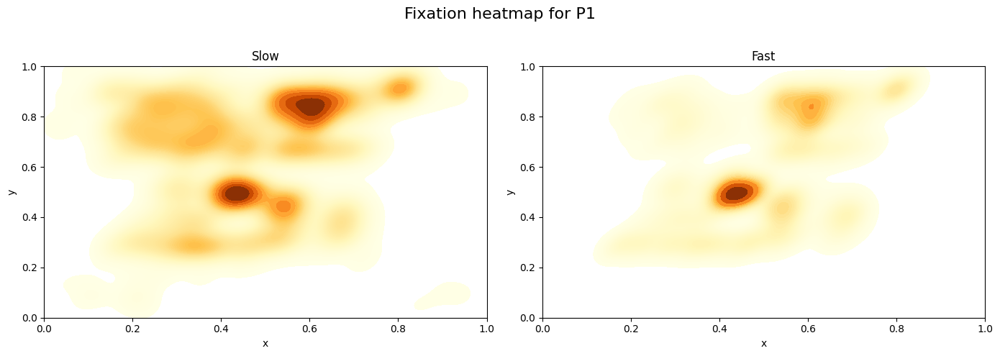

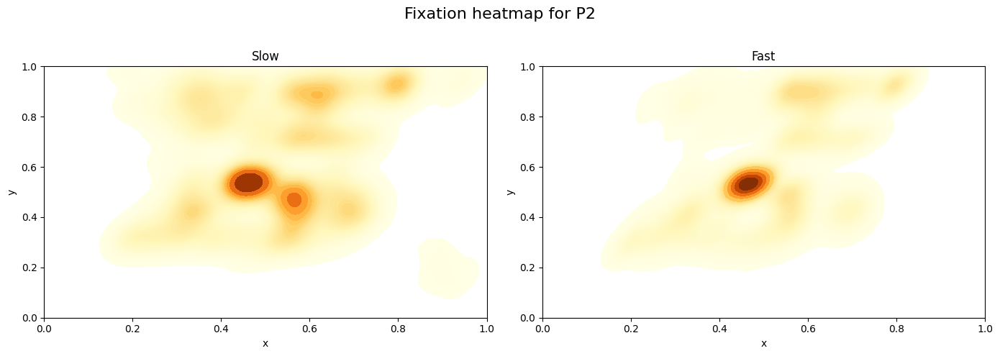

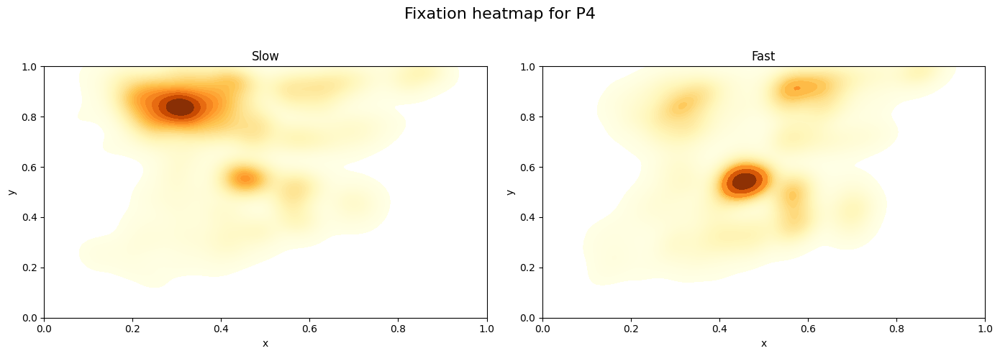

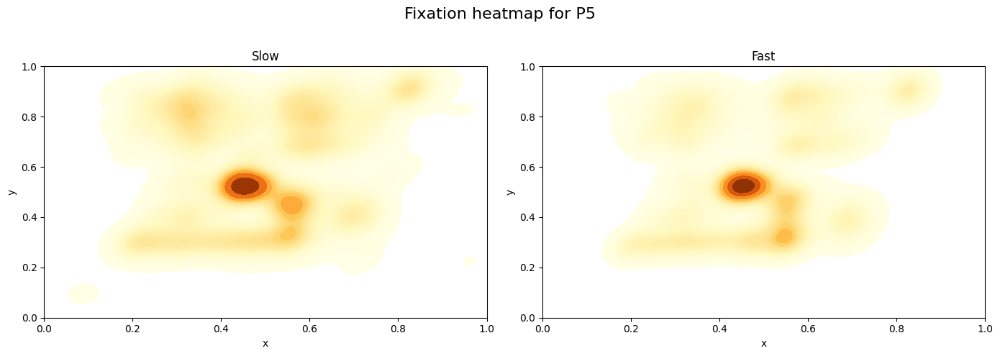

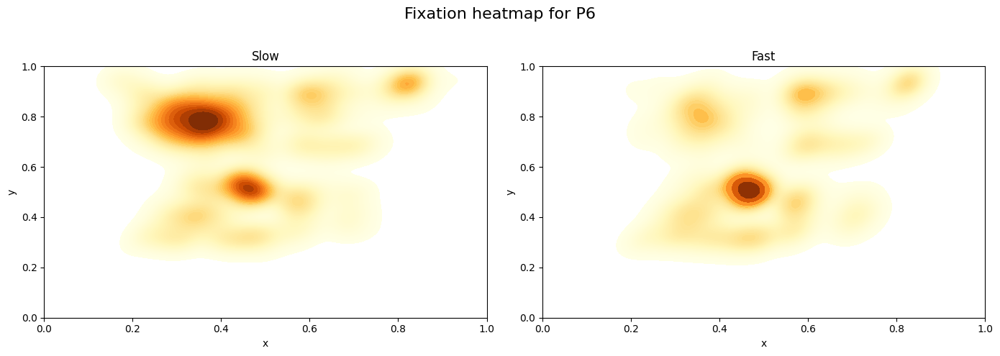

...

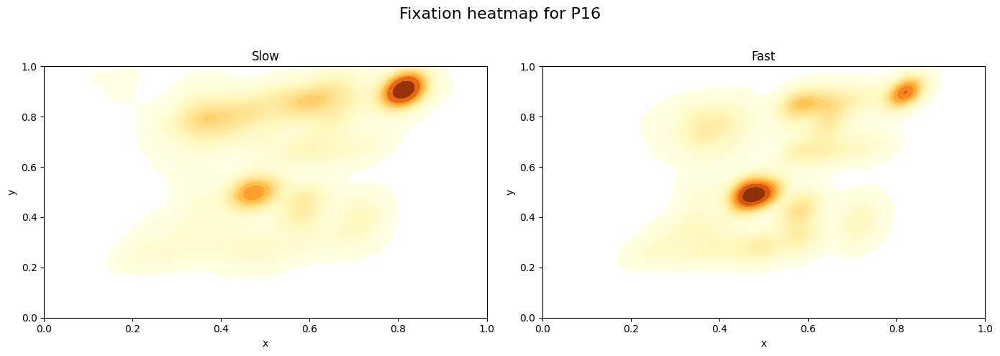

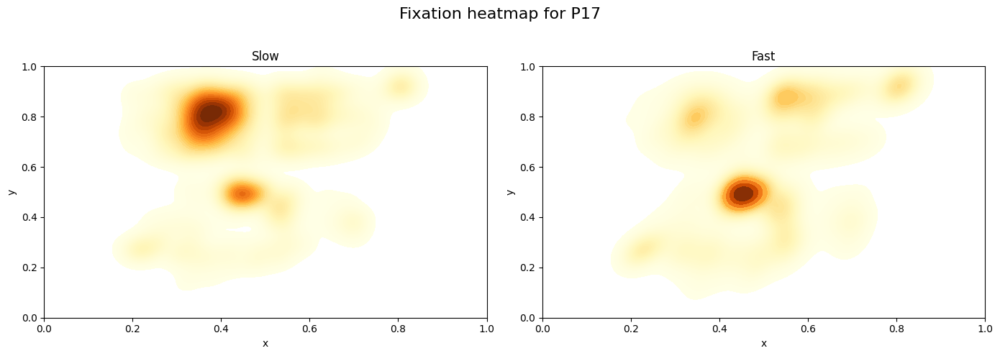

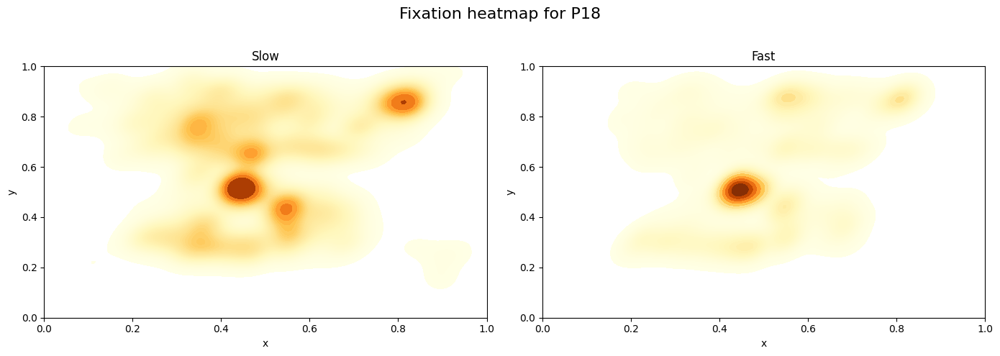

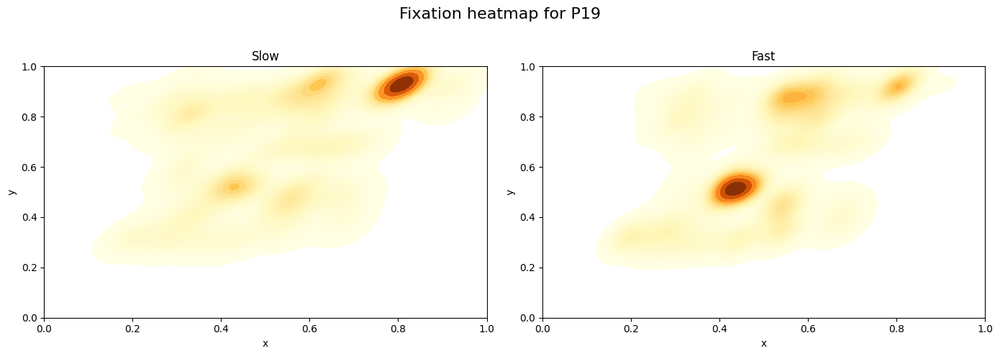

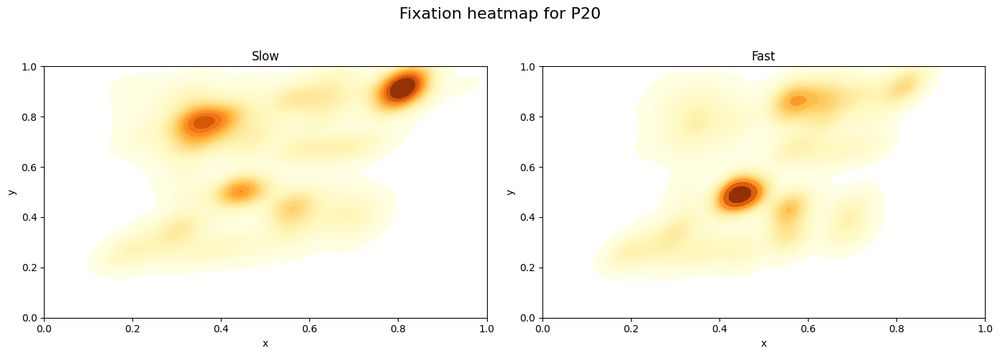

In [ ]:
for pid in participant_ids:
    participant_df_slow = heatmap_df_slow.query(f"participant_id == {pid}")
    participant_df_fast = heatmap_df_fast.query(f"participant_id == {pid}")

    # Create subplots with 1 row and 2 columns
    fig, axes = plt.subplots(1, 2, figsize=(14, 5))

    # slow condition heatmap
    sns.kdeplot(
        x=participant_df_slow['norm_pos_x'], 
        y=participant_df_slow['norm_pos_y'],
        fill=True, 
        levels=np.logspace(-2, 0, 100),
        hue_norm=(0,1),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[0],
        common_norm=True
    )
    axes[0].set_title('Slow')
    axes[0].set_xlim(0, 1)
    axes[0].set_ylim(0, 1)
    axes[0].set_xlabel('x')
    axes[0].set_ylabel('y')

    # fast condition heatmap
    sns.kdeplot(
        x=participant_df_fast['norm_pos_x'], 
        y=participant_df_fast['norm_pos_y'],
        fill=True, 
        hue_norm=(0,1),
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[1],
        common_norm=True
    )
    axes[1].set_title('Fast')
    axes[1].set_xlim(0, 1)
    axes[1].set_ylim(0, 1)
    axes[1].set_xlabel('x')
    axes[1].set_ylabel('y')

    # Add a unique title for the entire figure
    fig.suptitle(f'Fixation heatmap for P{pid}', fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
    plt.show()

##### Fixation heatmap by Difficulty&Frequency
- Easy_slow: areas rather than center are taken into consideration such as warning box and map (time-fillers?)
- Hard_slow: similar to easy_slow but with mre fixations also at the center (time-fillers + reading)
- Easy_fast: similar to hard_fast with a bit more or spread fixations
- Hard_fast: highly center-proned (considerable time spent at reading/checking explanations)

In [46]:
# Heatmap based on difficuty
unix_intervals_easy_slow = gui_df_easy_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_slow = gui_df_hard_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_easy_fast = gui_df_easy_fast['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_fast = gui_df_hard_fast['block_data'].apply(tuple).unique().tolist()

fixation_ddf = data['all_fixations_on_surface_HiDrive_Studie2'].query("on_surf == True"). loc[:, ['participant_id', 'start_timestamp_unix', 'norm_pos_x', 'norm_pos_y']].dropna()
fixation_df = fixation_ddf.compute()
heatmap_df = fixation_df[(fixation_df['norm_pos_x'] >= 0) & (fixation_df['norm_pos_x'] <= 1) & (fixation_df['norm_pos_y'] >= 0) & (fixation_df['norm_pos_y'] <= 1)]

# Get heatmap intervals
interval_mask_easy_slow = pd.Series(False, index=heatmap_df.index)
interval_mask_hard_slow = pd.Series(False, index=heatmap_df.index)
interval_mask_easy_fast = pd.Series(False, index=heatmap_df.index)
interval_mask_hard_fast = pd.Series(False, index=heatmap_df.index)

for start, _, end in unix_intervals_easy_slow:
    interval_mask_easy_slow |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_slow:
    interval_mask_hard_slow |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_easy_fast:
    interval_mask_easy_fast |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_fast:
    interval_mask_hard_fast |= (heatmap_df['start_timestamp_unix'] >= start) & (heatmap_df['start_timestamp_unix'] <= end)

heatmap_df_easy_slow = heatmap_df.loc[interval_mask_easy_slow, :]
heatmap_df_hard_slow = heatmap_df.loc[interval_mask_hard_slow, :]
heatmap_df_easy_fast = heatmap_df.loc[interval_mask_easy_fast, :]
heatmap_df_hard_fast = heatmap_df.loc[interval_mask_hard_fast, :]

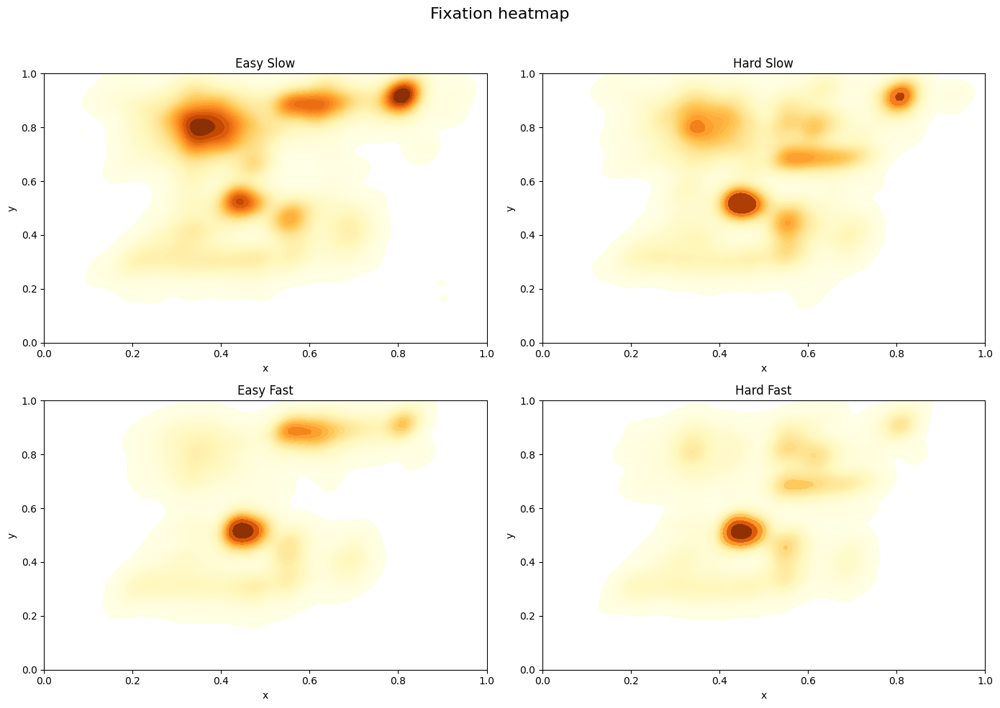

In [47]:
# Overall heatmap
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# Easy_slow condition heatmap
sns.kdeplot(
    x=heatmap_df_easy_slow['norm_pos_x'], 
    y=heatmap_df_easy_slow['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[0, 0],
    common_norm=True
)
axes[0, 0].set_title('Easy Slow')
axes[0, 0].set_xlim(0, 1)
axes[0, 0].set_ylim(0, 1)
axes[0, 0].set_xlabel('x')
axes[0, 0].set_ylabel('y')

# Hard_slow condition heatmap
sns.kdeplot(
    x=heatmap_df_hard_slow['norm_pos_x'], 
    y=heatmap_df_hard_slow['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[0, 1],
    common_norm=True
)
axes[0, 1].set_title('Hard Slow')
axes[0, 1].set_xlim(0, 1)
axes[0, 1].set_ylim(0, 1)
axes[0, 1].set_xlabel('x')
axes[0, 1].set_ylabel('y')

# Easy_fast condition heatmap
sns.kdeplot(
    x=heatmap_df_easy_fast['norm_pos_x'], 
    y=heatmap_df_easy_fast['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[1, 0],
    common_norm=True
)
axes[1, 0].set_title('Easy Fast')
axes[1, 0].set_xlim(0, 1)
axes[1, 0].set_ylim(0, 1)
axes[1, 0].set_xlabel('x')
axes[1, 0].set_ylabel('y')

# Hard_fast condition heatmap
sns.kdeplot(
    x=heatmap_df_hard_fast['norm_pos_x'], 
    y=heatmap_df_hard_fast['norm_pos_y'],
    fill=True, 
    hue_norm=(0,1),
    levels=np.logspace(-2, 0, 100),
    cmap=sns.color_palette("YlOrBr", as_cmap=True),
    cbar=False,  # Omit the color legend
    ax=axes[1, 1],
    common_norm=True
)
axes[1, 1].set_title('Hard Fast')
axes[1, 1].set_xlim(0, 1)
axes[1, 1].set_ylim(0, 1)
axes[1, 1].set_xlabel('x')
axes[1, 1].set_ylabel('y')

# Add a unique title for the entire figure
fig.suptitle(f'Fixation heatmap', fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
plt.show()

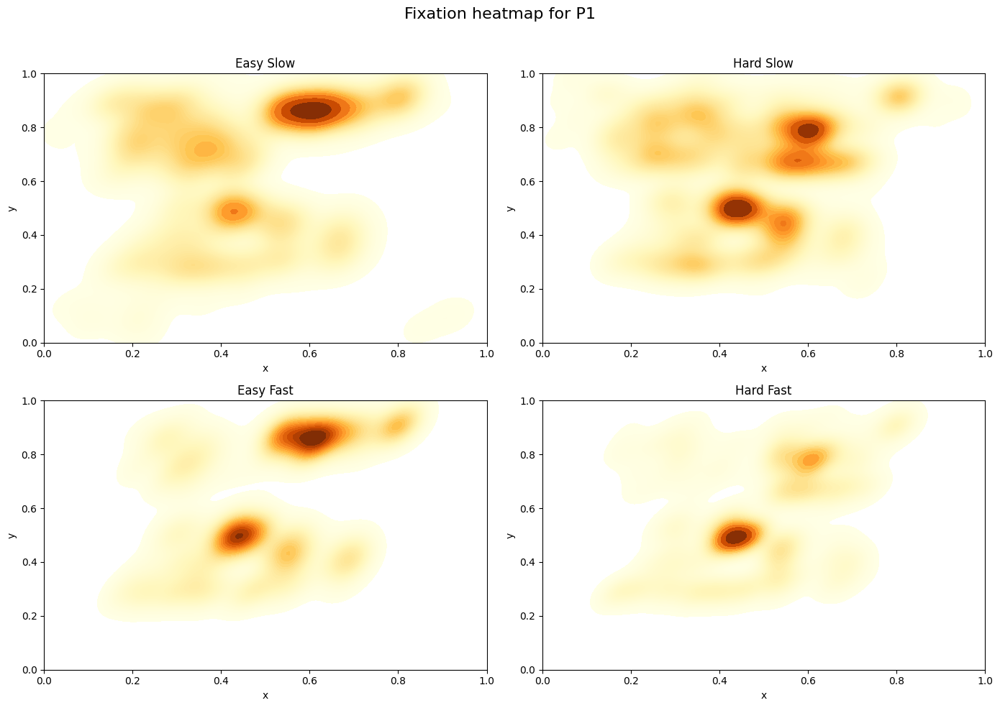

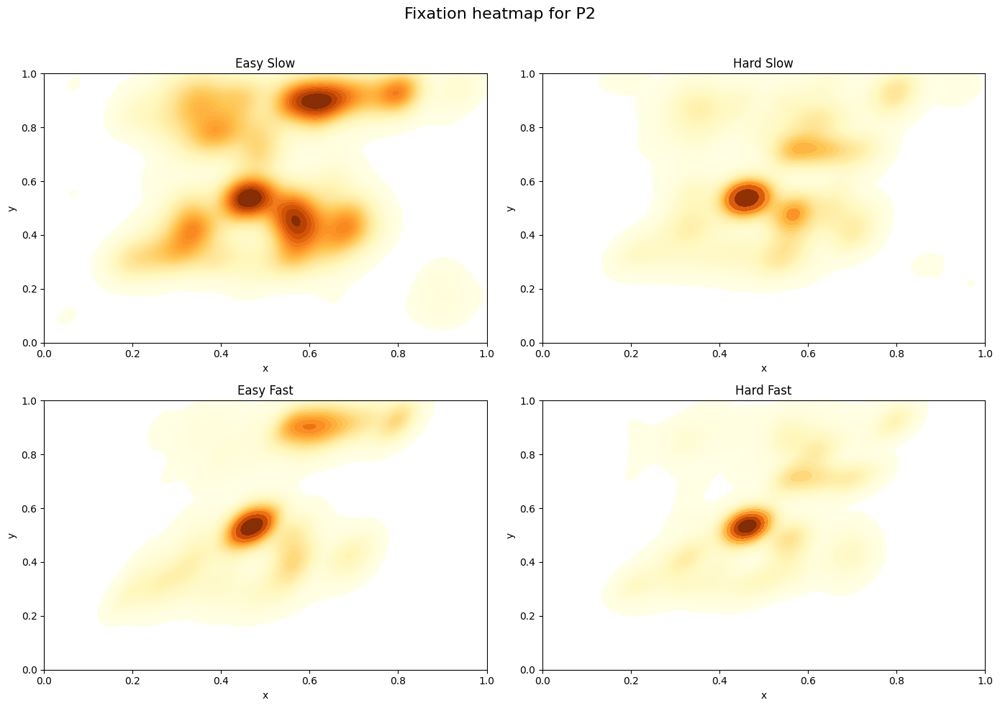

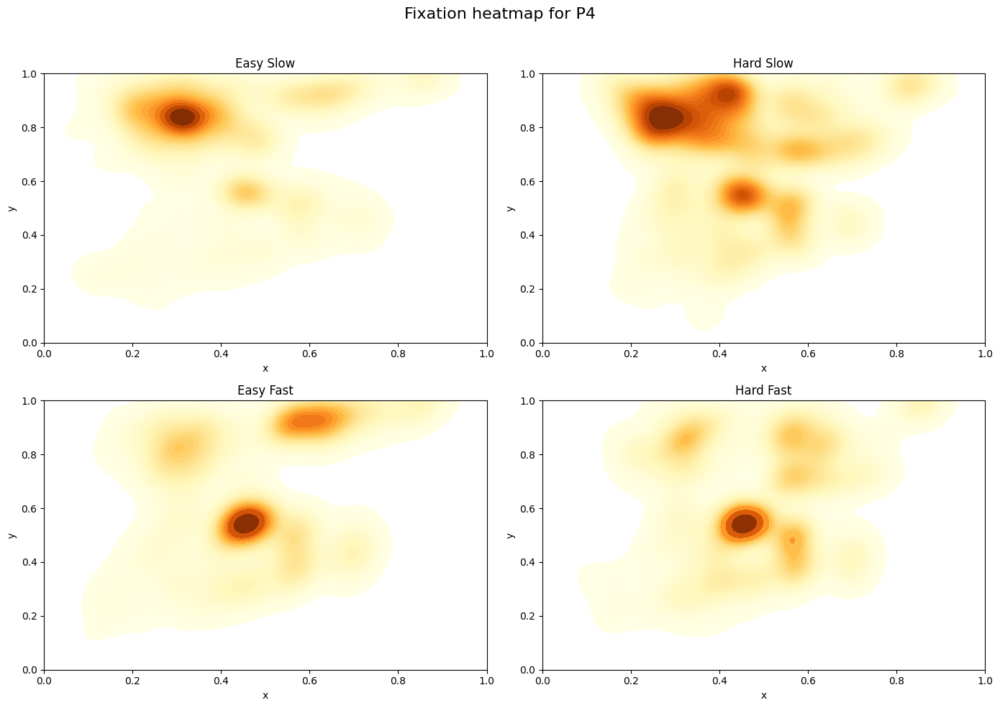

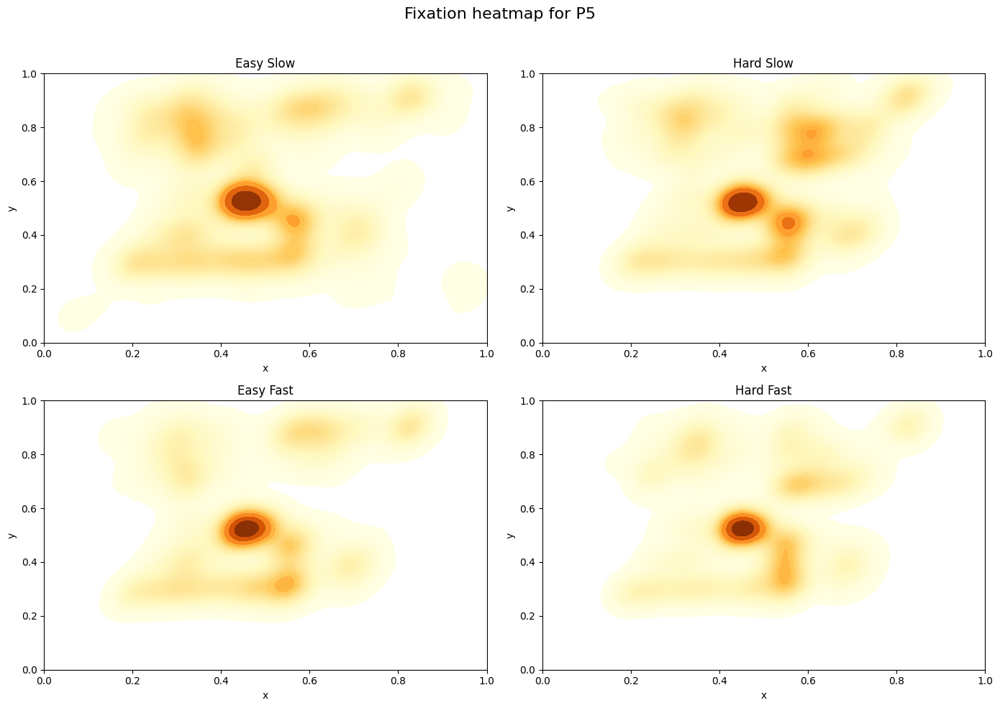

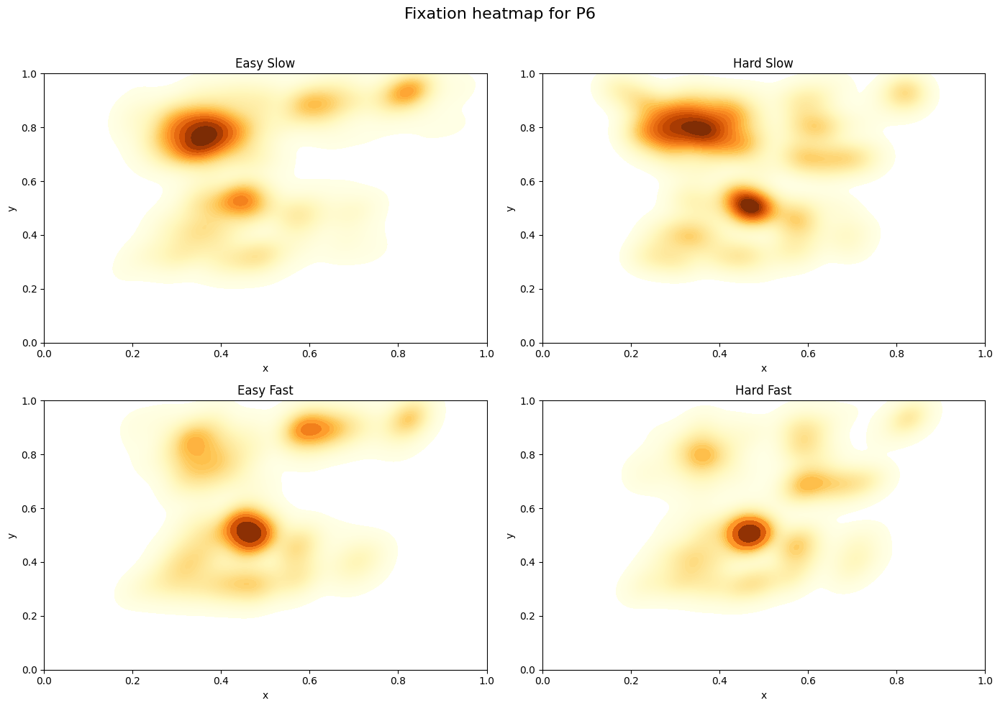

...

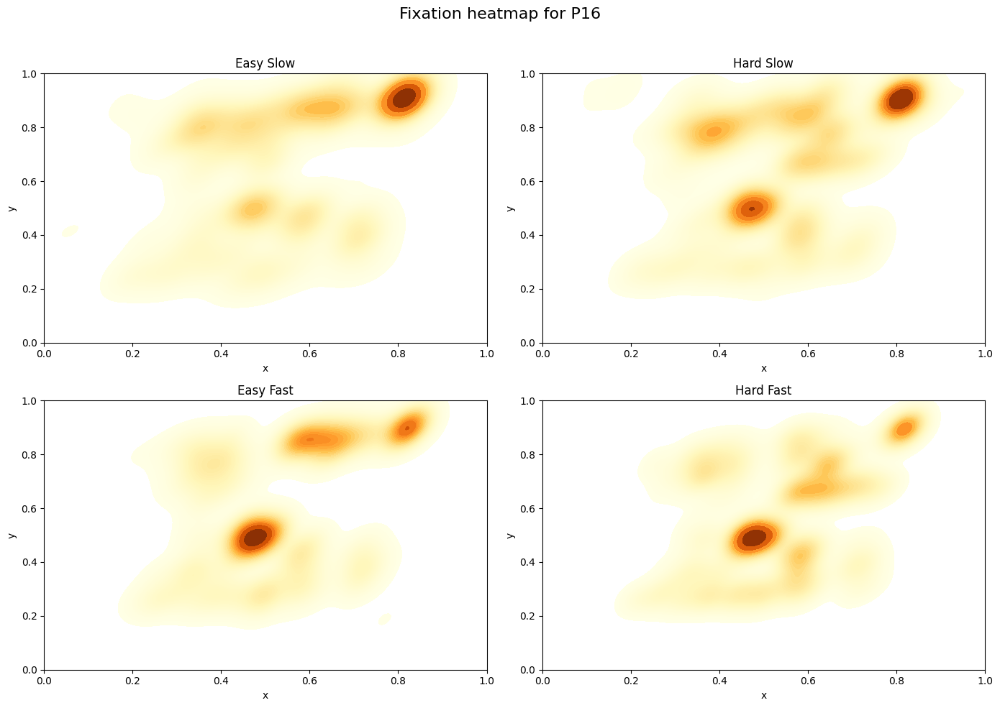

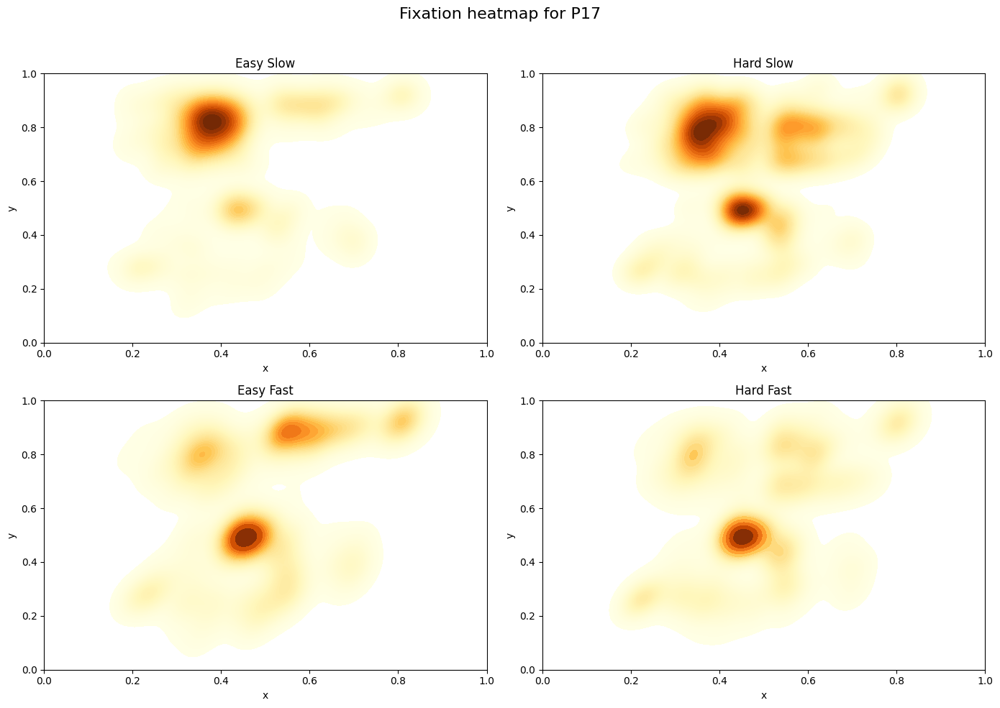

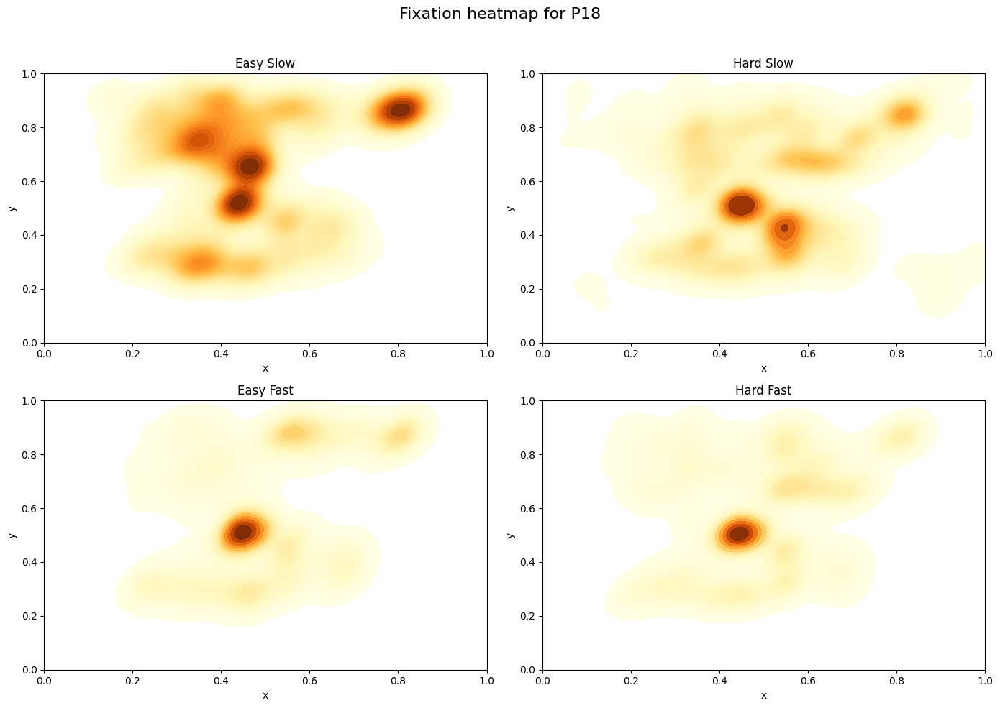

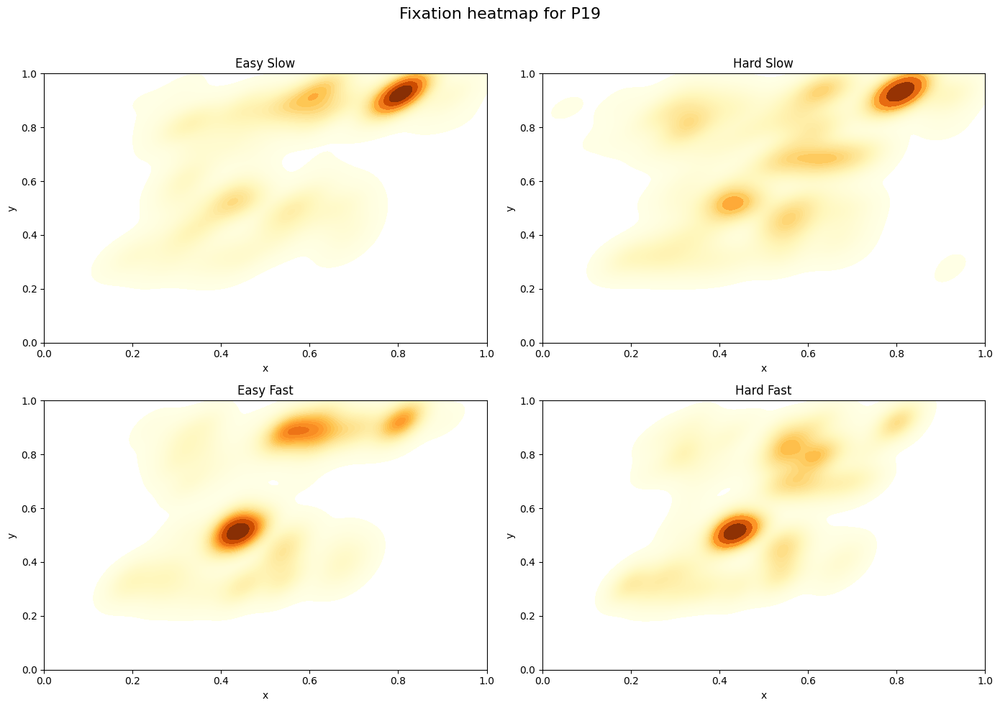

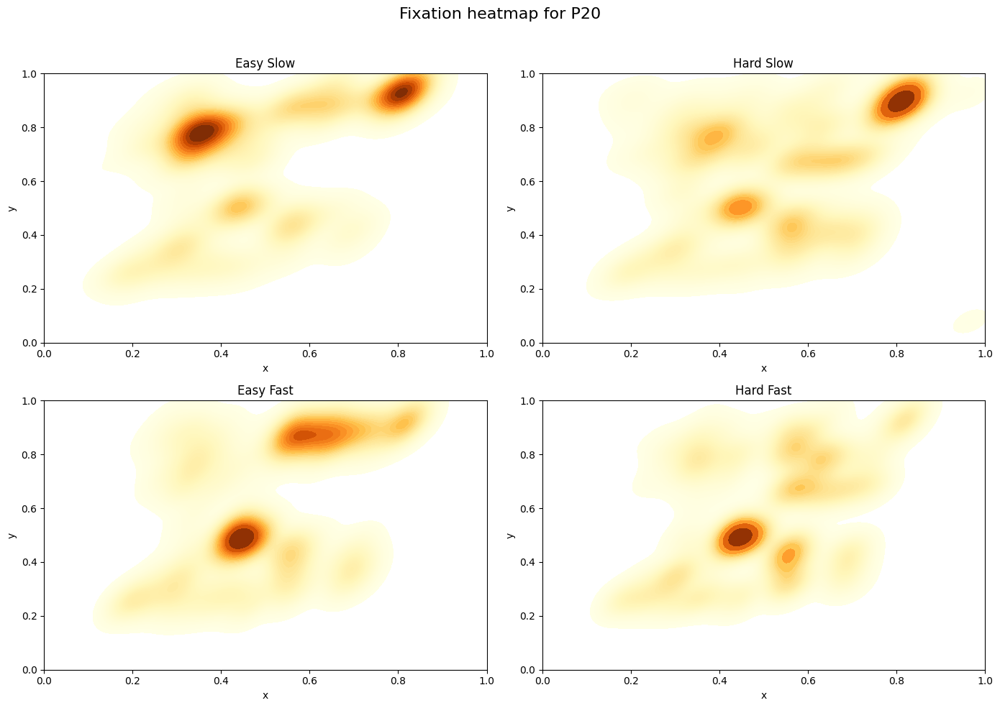

In [ ]:
for pid in participant_ids:
    participant_df_easy_slow = heatmap_df_easy_slow.query(f"participant_id == {pid}")
    participant_df_hard_slow = heatmap_df_hard_slow.query(f"participant_id == {pid}")
    participant_df_easy_fast = heatmap_df_easy_fast.query(f"participant_id == {pid}")
    participant_df_hard_fast = heatmap_df_hard_fast.query(f"participant_id == {pid}")

    # Create subplots with 2 rows and 2 columns
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))

    # Easy_slow condition heatmap
    sns.kdeplot(
        x=participant_df_easy_slow['norm_pos_x'], 
        y=participant_df_easy_slow['norm_pos_y'],
        fill=True, 
        hue_norm=(0,1),
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[0, 0],
        common_norm=True
    )
    axes[0, 0].set_title('Easy Slow')
    axes[0, 0].set_xlim(0, 1)
    axes[0, 0].set_ylim(0, 1)
    axes[0, 0].set_xlabel('x')
    axes[0, 0].set_ylabel('y')

    # Hard_slow condition heatmap
    sns.kdeplot(
        x=participant_df_hard_slow['norm_pos_x'], 
        y=participant_df_hard_slow['norm_pos_y'],
        fill=True, 
        hue_norm=(0,1),
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[0, 1],
        common_norm=True
    )
    axes[0, 1].set_title('Hard Slow')
    axes[0, 1].set_xlim(0, 1)
    axes[0, 1].set_ylim(0, 1)
    axes[0, 1].set_xlabel('x')
    axes[0, 1].set_ylabel('y')

    # Easy_fast condition heatmap
    sns.kdeplot(
        x=participant_df_easy_fast['norm_pos_x'], 
        y=participant_df_easy_fast['norm_pos_y'],
        fill=True, 
        hue_norm=(0,1),
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[1, 0],
        common_norm=True
    )
    axes[1, 0].set_title('Easy Fast')
    axes[1, 0].set_xlim(0, 1)
    axes[1, 0].set_ylim(0, 1)
    axes[1, 0].set_xlabel('x')
    axes[1, 0].set_ylabel('y')

    # Hard_fast condition heatmap
    sns.kdeplot(
        x=participant_df_hard_fast['norm_pos_x'], 
        y=participant_df_hard_fast['norm_pos_y'],
        fill=True, 
        hue_norm=(0,1),
        levels=np.logspace(-2, 0, 100),
        cmap=sns.color_palette("YlOrBr", as_cmap=True),
        cbar=False,  # Omit the color legend
        ax=axes[1, 1],
        common_norm=True
    )
    axes[1, 1].set_title('Hard Fast')
    axes[1, 1].set_xlim(0, 1)
    axes[1, 1].set_ylim(0, 1)
    axes[1, 1].set_xlabel('x')
    axes[1, 1].set_ylabel('y')

    # Add a unique title for the entire figure
    fig.suptitle(f'Fixation heatmap for P{pid}', fontsize=16)

    plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
    plt.show()

##### Blink rate by Difficulty
- No differences

In [ ]:
# Blink rate based on difficuty
unix_intervals_easy = gui_df_easy['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard = gui_df_hard['block_data'].apply(tuple).unique().tolist()

blinks_ddf = data['all_blinks'].loc[:, ['participant_id', 'start_timestamp_unix', 'id']].dropna()
blinks_df = blinks_ddf.compute()

# Get heatmap intervals
interval_mask_easy = pd.Series(False, index=blinks_df.index)
interval_mask_hard = pd.Series(False, index=blinks_df.index)

for start, _, end in unix_intervals_easy:
    interval_mask_easy |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard:
    interval_mask_hard |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)

blinks_df_easy = blinks_df.loc[interval_mask_easy, :]
blinks_df_hard = blinks_df.loc[interval_mask_hard, :]

<Figure size 1200x600 with 0 Axes>

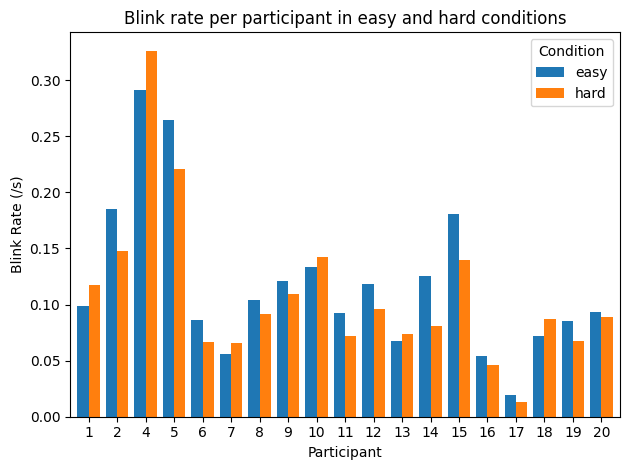

Easy: 0.1183 blink/s (~0.0694)
Hard: 0.1081 blink/s (~0.0694)


In [ ]:
# Compute and Visualize
def calculate_mean_blink_rate(blinks_df, intervals):
    blink_rates = []
    for start, _, end in intervals:
        block_blinks = blinks_df[(blinks_df['start_timestamp_unix'] >= start) & 
                                 (blinks_df['start_timestamp_unix'] <= end)]
        block_duration = end - start
        blink_rate = len(block_blinks) / block_duration
        blink_rates.append(blink_rate)
    return np.mean(blink_rates)

results = {'participant_id': [], 'condition': [], 'mean_blink_rate': []}

for pid in participant_ids:
    # Filter blinks for the current participant
    p_blinks_easy = blinks_df_easy.query(f"participant_id == {pid}")
    p_blinks_hard = blinks_df_hard.query(f"participant_id == {pid}")
    p_unix_intervals_easy = gui_df_easy.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    p_unix_intervals_hard = gui_df_hard.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()

    mean_blink_rate_easy = calculate_mean_blink_rate(p_blinks_easy, p_unix_intervals_easy)
    mean_blink_rate_hard = calculate_mean_blink_rate(p_blinks_hard, p_unix_intervals_hard)

    results['participant_id'].append(pid)
    results['condition'].append('easy')
    results['mean_blink_rate'].append(mean_blink_rate_easy)

    results['participant_id'].append(pid)
    results['condition'].append('hard')
    results['mean_blink_rate'].append(mean_blink_rate_hard)

results_df = pd.DataFrame(results)

# Visualize
plt.figure(figsize=(12, 6))
pivot_df = results_df.pivot(index='participant_id', columns='condition', values='mean_blink_rate')
pivot_df.plot(kind='bar', width=0.8)
plt.title('Blink rate per participant in easy and hard conditions')
plt.xlabel('Participant')
plt.ylabel('Blink Rate (/s)')
plt.xticks(rotation=0)  # Rotate x labels to 0 degrees for better readability
plt.legend(title='Condition')
plt.tight_layout()
plt.show()

# Print overall results
mean_easy = round(pivot_df['easy'].mean(), 4)
mean_hard = round(pivot_df['hard'].mean(), 4)
std_easy = round(pivot_df['easy'].std(), 4)
std_hard = round(pivot_df['hard'].std(), 4)

print(f"Easy: {mean_easy} blink/s (~{std_easy})")
print(f"Hard: {mean_hard} blink/s (~{std_hard})")

##### Blink rate by Frequency
- Overall blink rate is higher for slow condition

In [ ]:
# Blink rate based on frequency
unix_intervals_slow = gui_df_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_fast = gui_df_fast['block_data'].apply(tuple).unique().tolist()

blinks_ddf = data['all_blinks'].loc[:, ['participant_id', 'start_timestamp_unix', 'id']].dropna()
blinks_df = blinks_ddf.compute()

# Get heatmap intervals
interval_mask_slow = pd.Series(False, index=blinks_df.index)
interval_mask_fast = pd.Series(False, index=blinks_df.index)

for start, _, end in unix_intervals_slow:
    interval_mask_slow |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_fast:
    interval_mask_fast |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)

blinks_df_slow = blinks_df.loc[interval_mask_slow, :]
blinks_df_fast = blinks_df.loc[interval_mask_fast, :]

<Figure size 1200x600 with 0 Axes>

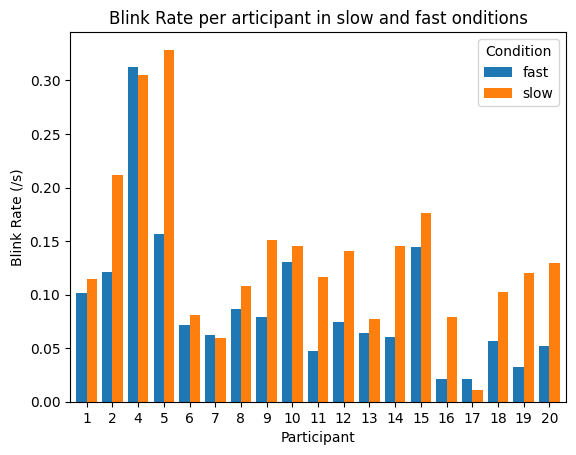

Slow: 0.137 blink/s (~0.0774)
Fast: 0.0893 blink/s (~0.0666)


In [ ]:
# Compute and Visualize
def calculate_mean_blink_rate(blinks_df, intervals):
    blink_rates = []
    for start, _, end in intervals:
        block_blinks = blinks_df[(blinks_df['start_timestamp_unix'] >= start) & 
                                 (blinks_df['start_timestamp_unix'] <= end)]
        block_duration = end - start
        blink_rate = len(block_blinks) / block_duration
        blink_rates.append(blink_rate)
    return np.mean(blink_rates)

results = {'participant_id': [], 'condition': [], 'mean_blink_rate': []}

for pid in participant_ids:
    p_blinks_slow = blinks_df_slow.query(f"participant_id == {pid}")
    p_blinks_fast = blinks_df_fast.query(f"participant_id == {pid}")
    p_unix_intervals_slow = gui_df_slow.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    p_unix_intervals_fast = gui_df_fast.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()

    mean_blink_rate_slow = calculate_mean_blink_rate(p_blinks_slow, p_unix_intervals_slow)
    mean_blink_rate_fast = calculate_mean_blink_rate(p_blinks_fast, p_unix_intervals_fast)

    results['participant_id'].append(pid)
    results['condition'].append('slow')
    results['mean_blink_rate'].append(mean_blink_rate_slow)

    results['participant_id'].append(pid)
    results['condition'].append('fast')
    results['mean_blink_rate'].append(mean_blink_rate_fast)

results_df = pd.DataFrame(results)

# Visualize
plt.figure(figsize=(12, 6))
pivot_df = results_df.pivot(index='participant_id', columns='condition', values='mean_blink_rate')
pivot_df.plot(kind='bar', width=0.8)
plt.title('Blink Rate per articipant in slow and fast onditions')
plt.xlabel('Participant')
plt.ylabel('Blink Rate (/s)')
plt.xticks(rotation=0)  # Rotate x labels to 0 degrees for better readability
plt.legend(title='Condition')
plt.show()

# Print overall results
mean_slow = round(pivot_df['slow'].mean(), 4)
mean_fast = round(pivot_df['fast'].mean(), 4)
std_slow = round(pivot_df['slow'].std(), 4)
std_fast = round(pivot_df['fast'].std(), 4)

print(f"Slow: {mean_slow} blink/s (~{std_slow})")
print(f"Fast: {mean_fast} blink/s (~{std_fast})")

##### Blink rate by Difficulty&Frequency
- Overall slow conditions has a higher blink rate
- Easy_slow presents the highest blink rate
- Hard_fast presents the lowest blink rate

In [ ]:
# Blink rate based on difficuty and frequency
unix_intervals_easy_slow = gui_df_easy_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_slow = gui_df_hard_slow['block_data'].apply(tuple).unique().tolist()
unix_intervals_easy_fast = gui_df_easy_fast['block_data'].apply(tuple).unique().tolist()
unix_intervals_hard_fast = gui_df_hard_fast['block_data'].apply(tuple).unique().tolist()

blinks_ddf = data['all_blinks'].loc[:, ['participant_id', 'start_timestamp_unix', 'id']].dropna()
blinks_df = blinks_ddf.compute()

# Get heatmap intervals
interval_mask_easy_slow = pd.Series(False, index=blinks_df.index)
interval_mask_hard_slow = pd.Series(False, index=blinks_df.index)
interval_mask_easy_fast = pd.Series(False, index=blinks_df.index)
interval_mask_hard_fast = pd.Series(False, index=blinks_df.index)

for start, _, end in unix_intervals_easy_slow:
    interval_mask_easy_slow |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_slow:
    interval_mask_hard_slow |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_easy_fast:
    interval_mask_easy_fast |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)
for start, _, end in unix_intervals_hard_fast:
    interval_mask_hard_fast |= (blinks_df['start_timestamp_unix'] >= start) & (blinks_df['start_timestamp_unix'] <= end)

blinks_df_easy_slow = blinks_df.loc[interval_mask_easy_slow, :]
blinks_df_hard_slow = blinks_df.loc[interval_mask_hard_slow, :]
blinks_df_easy_fast = blinks_df.loc[interval_mask_easy_fast, :]
blinks_df_hard_fast = blinks_df.loc[interval_mask_hard_fast, :]

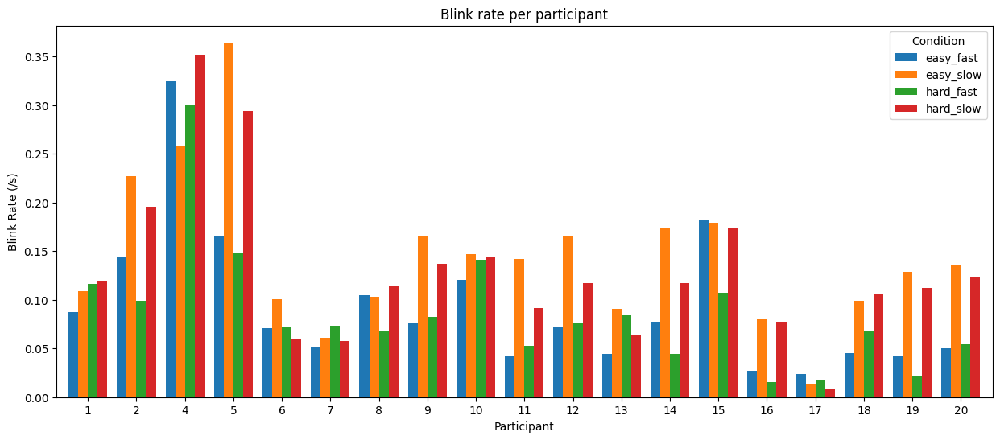

Easy_slow: 0.1444 blink/s (~0.0778)
Hard_slow: 0.1296 blink/s (~0.0808)
Easy_fast: 0.0922 blink/s (~0.0722)
Hard_fast: 0.0865 blink/s (~0.0637)


In [ ]:
# Compute and Visualize
def calculate_mean_blink_rate(blinks_df, intervals):
    blink_rates = []
    for start, _, end in intervals:
        block_blinks = blinks_df[(blinks_df['start_timestamp_unix'] >= start) & 
                                 (blinks_df['start_timestamp_unix'] <= end)]
        block_duration = end - start
        blink_rate = len(block_blinks) / block_duration
        blink_rates.append(blink_rate)
    return np.mean(blink_rates)

results = {'participant_id': [], 'condition': [], 'mean_blink_rate': []}

for pid in participant_ids:
    # Filter blinks for the current participant
    p_blinks_easy_slow = blinks_df_easy_slow.query(f"participant_id == {pid}")
    p_blinks_hard_slow = blinks_df_hard_slow.query(f"participant_id == {pid}")
    p_blinks_easy_fast = blinks_df_easy_fast.query(f"participant_id == {pid}")
    p_blinks_hard_fast = blinks_df_hard_fast.query(f"participant_id == {pid}")
    p_unix_intervals_easy_slow = gui_df_easy_slow.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    p_unix_intervals_hard_slow = gui_df_hard_slow.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    p_unix_intervals_easy_fast = gui_df_easy_fast.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()
    p_unix_intervals_hard_fast = gui_df_hard_fast.query(f"participant_id == {pid}")['block_data'].apply(tuple).unique().tolist()

    mean_blink_rate_easy_slow = calculate_mean_blink_rate(p_blinks_easy_slow, p_unix_intervals_easy_slow)
    mean_blink_rate_hard_slow = calculate_mean_blink_rate(p_blinks_hard_slow, p_unix_intervals_hard_slow)
    mean_blink_rate_easy_fast = calculate_mean_blink_rate(p_blinks_easy_fast, p_unix_intervals_easy_fast)
    mean_blink_rate_hard_fast = calculate_mean_blink_rate(p_blinks_hard_fast, p_unix_intervals_hard_fast)

    results['participant_id'].append(pid)
    results['condition'].append('easy_slow')
    results['mean_blink_rate'].append(mean_blink_rate_easy_slow)

    results['participant_id'].append(pid)
    results['condition'].append('hard_slow')
    results['mean_blink_rate'].append(mean_blink_rate_hard_slow)

    results['participant_id'].append(pid)
    results['condition'].append('easy_fast')
    results['mean_blink_rate'].append(mean_blink_rate_easy_fast)

    results['participant_id'].append(pid)
    results['condition'].append('hard_fast')
    results['mean_blink_rate'].append(mean_blink_rate_hard_fast)

results_df = pd.DataFrame(results)

# Visualize
pivot_df = results_df.pivot(index='participant_id', columns='condition', values='mean_blink_rate')
pivot_df.plot(kind='bar', width=0.8, figsize=(15, 6))
plt.title('Blink rate per participant')
plt.xlabel('Participant')
plt.ylabel('Blink Rate (/s)')
plt.xticks(rotation=0)  # Rotate x labels to 0 degrees for better readability
plt.legend(title='Condition')
plt.show()

# Print overall results
mean_easy_slow = round(pivot_df['easy_slow'].mean(), 4)
mean_hard_slow = round(pivot_df['hard_slow'].mean(), 4)
mean_easy_fast = round(pivot_df['easy_fast'].mean(), 4)
mean_hard_fast = round(pivot_df['hard_fast'].mean(), 4)
std_easy_slow = round(pivot_df['easy_slow'].std(), 4)
std_hard_slow = round(pivot_df['hard_slow'].std(), 4)
std_easy_fast = round(pivot_df['easy_fast'].std(), 4)
std_hard_fast = round(pivot_df['hard_fast'].std(), 4)

print(f"Easy_slow: {mean_easy_slow} blink/s (~{std_easy_slow})")
print(f"Hard_slow: {mean_hard_slow} blink/s (~{std_hard_slow})")
print(f"Easy_fast: {mean_easy_fast} blink/s (~{std_easy_fast})")
print(f"Hard_fast: {mean_hard_fast} blink/s (~{std_hard_fast})")